### Carregando as bibliotecas

In [ ]:
import pandas as pd
import nbformat
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import warnings
import matplotlib.pyplot as plt
import xgboost as xgb
import lightgbm as lgb
from Data_Trat.engenharia import Engenharia
from sklearn.model_selection import GridSearchCV

warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
print(nbformat.__version__)

5.10.4


### Carregando as bases

In [90]:
df_events = pd.read_csv('base_de_dados/historico_odds.csv')
df_stat = pd.read_csv('base_de_dados/historico_statistic.csv')

In [91]:
df_events.shape

(153818, 13)

In [92]:
df_stat.shape

(40548, 99)

In [93]:
# Dropando as duplicatas
df_events['data'] = pd.to_datetime(df_events['data'])
df_events = df_events.sort_values('data',ascending=False)
# df_events = df_events[df_events['status'] == 'finished']
df_events = df_events.drop_duplicates(subset='id')
df_events = df_events.sort_values('data',ascending=True)

id_counts = df_events['id'].value_counts()
id_counts = id_counts.sort_values()
id_counts
# df_events.shape

id
3965443     1
3965441     1
3965439     1
3967645     1
3965447     1
           ..
3965449     1
3965451     1
3971471     1
3967661     1
12437701    1
Name: count, Length: 153818, dtype: int64

In [94]:
id_counts = df_stat['id'].value_counts()
id_counts = id_counts.sort_values()
id_counts

id
12436925    1
12437707    1
12451003    1
12437737    1
12450987    1
           ..
7438104     1
12450996    1
12437701    1
12504410    1
8177272     1
Name: count, Length: 40548, dtype: int64

#### Realizando o merge entre as duas tabelas

In [95]:
# df_geral = pd.merge(df_events,df_odds,how='left',on=['id'])
# df_geral.to_csv('Resultados/historico_odds.csv',index=False)

df_geral = pd.merge(df_events,df_stat,how='left',on=['id'])
df_geral = df_geral.sort_values(by='data',ascending=False)


df_geral.shape

(153818, 111)

### Análise Exploratória

#### Avaliando as colunas e o tipos de dados

In [8]:
colunas = df_geral.columns
print('----Colunas e tipos de dados----')
for col in colunas:
    print(f'{col}: {type(df_geral[col][0])}')

----Colunas e tipos de dados----
data: <class 'pandas._libs.tslibs.timestamps.Timestamp'>
id: <class 'numpy.int64'>
pais: <class 'str'>
torneio: <class 'str'>
ano: <class 'str'>
temporada: <class 'str'>
time_casa: <class 'str'>
time_visitante: <class 'str'>
gols_casa: <class 'numpy.int64'>
gols_visitante: <class 'numpy.int64'>
odd_home_win: <class 'float'>
odd_draw: <class 'float'>
odd_away_win: <class 'float'>
Ball possession_home: <class 'float'>
Ball possession_away: <class 'float'>
Expected goals_home: <class 'numpy.float64'>
Expected goals_away: <class 'numpy.float64'>
Big chances_home: <class 'numpy.float64'>
Big chances_away: <class 'numpy.float64'>
Total shots_home: <class 'numpy.float64'>
Total shots_away: <class 'numpy.float64'>
Goalkeeper saves_home: <class 'numpy.float64'>
Goalkeeper saves_away: <class 'numpy.float64'>
Corner kicks_home: <class 'numpy.float64'>
Corner kicks_away: <class 'numpy.float64'>
Fouls_home: <class 'numpy.float64'>
Fouls_away: <class 'numpy.float64'>

In [9]:
print('----Avaliando quantidade de nulos por coluna----')
for col in colunas:
    nulos = df_geral[col].isnull().sum()
    print(f'{col}: {nulos}')    


----Avaliando quantidade de nulos por coluna----
data: 0
id: 0
pais: 0
torneio: 0
ano: 0
temporada: 0
time_casa: 0
time_visitante: 0
gols_casa: 0
gols_visitante: 0
odd_home_win: 117603
odd_draw: 117603
odd_away_win: 117603
Ball possession_home: 114482
Ball possession_away: 114482
Expected goals_home: 144971
Expected goals_away: 144971
Big chances_home: 127319
Big chances_away: 127319
Total shots_home: 117350
Total shots_away: 117350
Goalkeeper saves_home: 114324
Goalkeeper saves_away: 114324
Corner kicks_home: 113286
Corner kicks_away: 113286
Fouls_home: 114102
Fouls_away: 114102
Passes_home: 119334
Passes_away: 119334
Tackles_home: 126442
Tackles_away: 126442
Free kicks_home: 114099
Free kicks_away: 114099
Yellow cards_home: 114457
Yellow cards_away: 114457
Shots on target_home: 114062
Shots on target_away: 114062
Hit woodwork_home: 118633
Hit woodwork_away: 118633
Shots off target_home: 114069
Shots off target_away: 114069
Blocked shots_home: 118485
Blocked shots_away: 118485
Shots i

##### O trabalho de modelagem se conscentra nas 10 principais ligas de futebol no mundo segundo o GE, portanto:

In [10]:
# Principais ligas no mundo
# https://ge.globo.com/futebol/futebol-internacional/noticia/2024/10/14/brasileirao-e-a-sexta-liga-mais-forte-do-mundo-aponta-estudo.ghtml

# Premier League (Inglaterra) - 87,9 pontos
# Serie A (Itália) - 86,2
# Bundesliga (Alemanha) - 86,2
# La Liga (Espanha) - 85,1
# Ligue 1 (França) - 85,1
# Série A (Brasil) - 80,1
# Jupiler Pro League (Bélgica) - 79,2
# Major League Soccer (Estados Unidos) - 78,2
# Championship (Inglaterra) - 77,6
# Liga Profesional (Argentina) - 77,5

list_paises = ['Argentina', 'Brazil', 'England','Belgium', 'Germany','Italy','Spain','France','USA']
list_principais_ligas = ['Premier League','Serie A','Bundesliga','LaLiga','Ligue 1','Brasileirão Betano','First Division A','MLS','Championship','Liga Profesional']

In [11]:
# Filtrando as principais ligas
df_geral_ligas = df_geral.copy()

df_geral_ligas = df_geral_ligas.loc[df_geral_ligas['pais'].isin(list_paises)]
df_geral_ligas = df_geral_ligas.loc[df_geral_ligas['torneio'].isin(list_principais_ligas)]
# df_geral_ligas = df_geral_ligas.loc[df_geral_ligas['temporada'].str.contains("|".join(list_principais_ligas))]

# Passando data para o formato datetime
df_geral_ligas['data'] = pd.to_datetime(df_geral_ligas['data'])

df_geral_ligas.shape

(41427, 111)

##### As partidas são desde o inicio de 2014, portanto haverá temporadas 13/14 nos campeonatos europeus

In [12]:
# Data 
data_max = df_geral_ligas['data'].max()
data_min = df_geral_ligas['data'].min()

print(f'Data max: {data_max}\nData min: {data_min}')

Data max: 2025-02-04 00:00:00
Data min: 2014-01-02 00:00:00


In [13]:
# Tradução das colunas

# https://www.sofascore.com/pt/football/match/tottenham-hotspur-leicester-city/MXpf#id:12436907

# Ball possession_home: ['61%'] - Posse de bola
# Ball possession_away: ['39%'] - Posse de bola
# Expected goals_home: [1.04] - Gols esperados
# Expected goals_away: [1.56] - Gols esperados
# Big chances_home: [2.] - Grandes chances
# Big chances_away: [1.] - Grandes chances
# Total shots_home: [15.] - Finalizações
# Total shots_away: [12.] - Finalizações
# Goalkeeper saves_home: [1.] - Defesas do goleiro 
# Goalkeeper saves_away: [5.] - Defesas do goleiro 
# Corner kicks_home: [6.] - Escanteios
# Corner kicks_away: [4.] - Escanteios
# Fouls_home: [6.] - Faltas
# Fouls_away: [16.] - Faltas
# Passes_home: [535.] - Passes
# Passes_away: [354.] - Passes
# Tackles_home: [10.] - Desarmes
# Tackles_away: [26.] - Desarmes
# Free kicks_home: [16.] - Faltas (Tiros Diretos)
# Free kicks_away: [6.] - Faltas (Tiros Diretos)
# Yellow cards_home: [1.] - Cartões Amarelos
# Yellow cards_away: [5.] - Cartões Amarelos
# Shots on target_home: [6.] - Finalizações no gol
# Shots on target_away: [3.] - Finalizações no gol
# Hit woodwork_home: [2.] - Finalizações na Trave
# Hit woodwork_away: [0.] - Finalizações na Trave
# Shots off target_home: [5.] - Chutes para Fora
# Shots off target_away: [2.] - Chutes para Fora
# Blocked shots_home: [4.] - Chutes bloqueados
# Blocked shots_away: [7.] - Chutes bloqueados
# Shots inside box_home: [8.] - Finalizações de dentro da área
# Shots inside box_away: [6.] - Finalizações de dentro da área
# Shots outside box_home: [7.] - Finalizações de fora da área
# Shots outside box_away: [6.] - Finalizações de fora da área
# Big chances scored_home: [1.] - Grandes chances marcados
# Big chances scored_away: [1.] - Grandes chances marcados
# Big chances missed_home: [1.] - Grandes chances perdidas
# Big chances missed_away: [0.] - Grandes chances perdidas
# Touches in penalty area_home: [23.] - Ações com a bola na área de pênalti
# Touches in penalty area_away: [15.] - Ações com a bola na área de pênalti
# Fouled in final third_home: [6.] - Faltas sofridas no terço final
# Fouled in final third_away: [0.] - Faltas sofridas no terço final
# Offsides_home: [5.] - Impedimentos
# Offsides_away: [2.] - Impedimentos
# Accurate passes_home: [450.] - Passes certos
# Accurate passes_away: [263.] - Passes certos
# Throw-ins_home: [26.] - Laterais
# Throw-ins_away: [12.] - Laterais
# Final third entries_home: [61.] - Entradas no terço final
# Final third entries_away: [53.] - Entradas no terço final
# Final third phase_home: ['110/143 (77%)'] - Passes no terço final
# Final third phase_away: ['67/101 (66%)'] - Passes no terço final
# Long balls_home: ['20/42 (48%)'] - Bolas longas
# Long balls_away: ['27/65 (42%)'] - Bolas longas
# Crosses_home: ['6/34 (18%)'] - Cruzamentos
# Crosses_away: ['3/16 (19%)'] - Cruzamentos
# Duels_home: ['46%'] - Duelos
# Duels_away: ['54%'] - Duelos
# Dispossessed_home: [16.] - Desarmes sofridos
# Dispossessed_away: [6.] - Desarmes sofridos
# Ground duels_home: ['32/73 (44%)'] - Duelos no chão
# Ground duels_away: ['41/73 (56%)'] - Duelos no chão
# Aerial duels_home: ['19/38 (50%)'] - Duelos aéreos
# Aerial duels_away: ['19/38 (50%)'] - Duelos aéreos
# Dribbles_home: ['6/16 (38%)'] - Dribles
# Dribbles_away: ['10/14 (71%)'] - Dribles
# Tackles won_home: ['60%'] - Desarmes ganhos
# Tackles won_away: ['65%'] - Desarmes ganhos
# Total tackles_home: [10.] - Desarmes
# Total tackles_away: [26.] - Desarmes
# Interceptions_home: [9.] - Interceptações
# Interceptions_away: [16.] - Interceptações
# Recoveries_home: [60.] - Recuperações de bola
# Recoveries_away: [62.] - Recuperações de bola
# Clearances_home: [16.] - Cortes
# Clearances_away: [32.] - Cortes
# Errors lead to a shot_home: [1.] - Erros levam a chute
# Errors lead to a shot_away: [0.] - Erros levam a chute
# Total saves_home: [1.] - Defesas do goleiro
# Total saves_away: [5.] - Defesas do goleiro
# Goals prevented_home: [-0.46] - Gols evitados
# Goals prevented_away: [0.77] - Gols evitados
# Big saves_home: [0.] - Grandes defesas
# Big saves_away: [2.] - Grandes defesas
# High claims_home: [0.] - Bolas aéreas reivindicadas
# High claims_away: [1.] - Bolas aéreas reivindicadas
# Punches_home: [1.] - Socos
# Punches_away: [3.] - Socos
# Goal kicks_home: [4.] - Tiros de meta
# Goal kicks_away: [7.] - Tiros de meta
# Red cards_home: [nan] - Cartões Vermelhos
# Red cards_away: [nan] - Cartões Vermelhos
# Through balls_home: [nan] - Passe em profundidade
# Through balls_away: [nan] - Passe em profundidade
# Penalty saves_home: [nan] - Penaltis defendidos
# Penalty saves_away: [nan] - Penaltis defendidos
# Errors lead to a goal_home: [nan] - Erros levam a gol
# Errors lead to a goal_away: [nan] - Erros levam a gol


In [14]:
shape = df_geral_ligas.shape
linhas = shape[0]
colunas = shape[1]

print(f'Total linhas: {linhas}\nTotal colunas: {colunas}')

Total linhas: 41427
Total colunas: 111


##### Inglaterra possui mais dados pq possui duas ligas entre as mais importantes do mundo

In [15]:
# Quantidades de partidas por país e torneio

display(df_geral_ligas.groupby(['pais']).size())
display(df_geral_ligas.groupby(['torneio']).size())

pais
Argentina     3768
Belgium       2846
Brazil        4179
England      10386
France        3995
Germany       3393
Italy         4240
Spain         4230
USA           4390
dtype: int64

torneio
Brasileirão Betano    4179
Bundesliga            3393
Championship          6157
First Division A      2846
LaLiga                4230
Liga Profesional      3768
Ligue 1               3995
MLS                   4390
Premier League        4229
Serie A               4240
dtype: int64

In [16]:
# Eliminando colunas que não são necessárias

df_geral_ligas_id = df_geral_ligas.copy()
df_geral_ligas = df_geral_ligas.drop(columns=['id'])

##### Convertendo as odds do sistema fracionário para o sistema decimal

In [17]:
df_geral_cols = df_geral_ligas.copy()

In [18]:
# Fução para converter as odds para o sistema decimal
def convert_odd(x):

    if isinstance(x, str):

        list_x = x.split('/')
        numerador = int(list_x[0])
        denominador = int(list_x[1])

        odd = (numerador/denominador) + 1

    else:
        odd = np.nan

    return odd

In [19]:
# Convertendo odds
list_odds_cols = ['odd_home_win','odd_away_win','odd_draw']


for col in list_odds_cols:
    df_geral_cols[col] = df_geral_cols[col].apply(lambda x: convert_odd(x))

df_geral_cols.shape

(41427, 110)

Convertendo os dados que estão categóricos para numérico

In [20]:
def split_by(x,i,pi,f,pf):

    if isinstance(x,str):

        x1 = x.split(i)[pi]

        try:
            x2 = x1.split(f)[pf]
            return int(x2)
        except:
            return int(x1)

    else:
        return x

In [21]:
# Ground duels_home
df_geral_cols['Ground duels_home'] = df_geral_cols['Ground duels_home'].apply(lambda x: split_by(x,'(',1,'%',0))
# Ground duels_away
df_geral_cols['Ground duels_away'] = df_geral_cols['Ground duels_away'].apply(lambda x: split_by(x,'(',1,'%',0))

# Aerial duels_home
df_geral_cols['Aerial duels_home'] = df_geral_cols['Aerial duels_home'].apply(lambda x: split_by(x,'(',1,'%',0))
# Aerial duels_away
df_geral_cols['Aerial duels_away'] = df_geral_cols['Aerial duels_away'].apply(lambda x: split_by(x,'(',1,'%',0))

# Ball possession_home
df_geral_cols['Ball possession_home'] = df_geral_cols['Ball possession_home'].apply(lambda x: split_by(x,'%',0,'',0))
# Ball possession_away
df_geral_cols['Ball possession_away'] = df_geral_cols['Ball possession_away'].apply(lambda x: split_by(x,'%',0,'',0))

# Crosses_home
df_geral_cols['Crosses_home'] = df_geral_cols['Crosses_home'].apply(lambda x: split_by(x,'(',1,'%',0))
# Crosses_away
df_geral_cols['Crosses_away'] = df_geral_cols['Crosses_away'].apply(lambda x: split_by(x,'(',1,'%',0))

# Long balls_home
df_geral_cols['Long balls_home'] = df_geral_cols['Long balls_home'].apply(lambda x: split_by(x,'(',1,'%',0))
# Long balls_away
df_geral_cols['Long balls_away'] = df_geral_cols['Long balls_away'].apply(lambda x: split_by(x,'(',1,'%',0))

# Dribbles_home_home
df_geral_cols['Dribbles_home'] = df_geral_cols['Dribbles_home'].apply(lambda x: split_by(x,'(',1,'%',0))
# Dribbles_away
df_geral_cols['Dribbles_away'] = df_geral_cols['Dribbles_away'].apply(lambda x: split_by(x,'(',1,'%',0))

# Tackles won_home
df_geral_cols['Tackles won_home'] = df_geral_cols['Tackles won_home'].apply(lambda x: split_by(x,'%',0,'',0))
# Tackles won_away
df_geral_cols['Tackles won_away'] = df_geral_cols['Tackles won_away'].apply(lambda x: split_by(x,'%',0,'',0))

# Duels_home
df_geral_cols['Duels_home'] = df_geral_cols['Duels_home'].apply(lambda x: split_by(x,'%',0,'',0))
# Duels_away
df_geral_cols['Duels_away'] = df_geral_cols['Duels_away'].apply(lambda x: split_by(x,'%',0,'',0))

# Final third phase_home
df_geral_cols['Final third phase_home'] = df_geral_cols['Final third phase_home'].apply(lambda x: split_by(x,'(',1,'%',0))
# Final third phase_away
df_geral_cols['Final third phase_away'] = df_geral_cols['Final third phase_away'].apply(lambda x: split_by(x,'(',1,'%',0))

df_geral_cols

,data,pais,torneio,ano,temporada,time_casa,time_visitante,gols_casa,gols_visitante,odd_home_win,odd_draw,odd_away_win,Ball possession_home,Ball possession_away,Expected goals_home,Expected goals_away,Big chances_home,Big chances_away,Total shots_home,Total shots_away,Goalkeeper saves_home,Goalkeeper saves_away,Corner kicks_home,Corner kicks_away,Fouls_home,Fouls_away,Passes_home,Passes_away,Tackles_home,Tackles_away,Free kicks_home,Free kicks_away,Yellow cards_home,Yellow cards_away,Shots on target_home,Shots on target_away,Hit woodwork_home,Hit woodwork_away,Shots off target_home,Shots off target_away,Blocked shots_home,Blocked shots_away,Shots inside box_home,Shots inside box_away,Shots outside box_home,Shots outside box_away,Big chances scored_home,Big chances scored_away,Big chances missed_home,Big chances missed_away,Through balls_home,Through balls_away,Touches in penalty area_home,Touches in penalty area_away,Fouled in final third_home,Fouled in final third_away,Offsides_home,Offsides_away,Accurate passes_home,Accurate passes_away,Throw-ins_home,Throw-ins_away,Final third entries_home,Final third entries_away,Final third phase_home,Final third phase_away,Long balls_home,Long balls_away,Crosses_home,Crosses_away,Duels_home,Duels_away,Dispossessed_home,Dispossessed_away,Ground duels_home,Ground duels_away,Aerial duels_home,Aerial duels_away,Dribbles_home,Dribbles_away,Tackles won_home,Tackles won_away,Total tackles_home,Total tackles_away,Interceptions_home,Interceptions_away,Recoveries_home,Recoveries_away,Clearances_home,Clearances_away,Errors lead to a shot_home,Errors lead to a shot_away,Errors lead to a goal_home,Errors lead to a goal_away,Total saves_home,Total saves_away,Goals prevented_home,Goals prevented_away,Big saves_home,Big saves_away,Goal kicks_home,Goal kicks_away,Punches_home,Punches_away,High claims_home,High claims_away,Penalty saves_home,Penalty saves_away,Red cards_home,Red cards_away
153817,2025-02-04,Spain,LaLiga,24/25,LaLiga 24/25,Girona FC,Las Palmas,2,1,1.570,4.20,5.25,47.0,53.0,2.03,1.29,4.0,3.0,12.0,10.0,1.0,3.0,11.0,3.0,12.0,12.0,426.0,497.0,11.0,15.0,11.0,12.0,2.0,3.0,4.0,2.0,0.0,0.0,4.0,5.0,4.0,3.0,11.0,7.0,1.0,3.0,1.0,1.0,3.0,2.0,1.0,0.0,25.0,19.0,3.0,2.0,6.0,3.0,368.0,421.0,10.0,16.0,48.0,59.0,76.0,73.0,55.0,39.0,25.0,21.0,45.0,55.0,6.0,4.0,43.0,57.0,48.0,52.0,18.0,46.0,55.0,53.0,11.0,15.0,8.0,4.0,40.0,38.0,22.0,29.0,2.0,0.0,NaN,NaN,1.0,3.0,0.24,0.39,0.0,2.0,6.0,5.0,0.0,1.0,NaN,NaN,0.0,1.0,NaN,NaN
153783,2025-02-04,England,Championship,24/25,Championship 24/25,Middlesbrough,Sunderland,2,3,2.375,3.30,3.00,53.0,47.0,1.43,2.07,2.0,2.0,12.0,12.0,7.0,2.0,1.0,5.0,11.0,15.0,483.0,423.0,18.0,16.0,15.0,11.0,2.0,3.0,4.0,9.0,0.0,0.0,4.0,1.0,4.0,2.0,8.0,9.0,4.0,3.0,1.0,1.0,1.0,1.0,1.0,2.0,17.0,24.0,2.0,0.0,0.0,4.0,397.0,347.0,25.0,19.0,74.0,58.0,67.0,68.0,39.0,30.0,44.0,31.0,48.0,52.0,7.0,9.0,53.0,47.0,33.0,67.0,40.0,47.0,67.0,63.0,18.0,16.0,5.0,10.0,43.0,50.0,17.0,14.0,NaN,NaN,1.0,1.0,7.0,2.0,-0.47,0.57,1.0,0.0,5.0,7.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,NaN
153784,2025-02-04,England,Championship,24/25,Championship 24/25,Queens Park Rangers,Blackburn Rovers,2,1,2.500,3.30,2.75,53.0,47.0,1.27,1.60,0.0,2.0,17.0,10.0,3.0,4.0,11.0,2.0,9.0,11.0,427.0,391.0,22.0,22.0,11.0,8.0,NaN,NaN,6.0,4.0,0.0,1.0,6.0,2.0,5.0,4.0,10.0,8.0,7.0,2.0,0.0,1.0,0.0,1.0,NaN,NaN,28.0,18.0,4.0,1.0,1.0,2.0,340.0,290.0,25.0,28.0,57.0,60.0,66.0,54.0,44.0,38.0,32.0,21.0,52.0,48.0,9.0,10.0,53.0,47.0,51.0,49.0,38.0,37.0,50.0,68.0,22.0,22.0,4.0,5.0,55.0,49.0,25.0,36.0,NaN,NaN,NaN,NaN,3.0,4.0,0.90,-0.14,2.0,1.0,4.0,10.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN
153812,2025-02-04,Italy,Serie A,24/25,Serie A 24/25,Cagliari,Lazio,1,2,3.500,3.40,2.05,39.0,61.0,1.58,1.29,2.0,4.0,15.0,11.0,4.0,4.0,7.0,7.0,14.0,9.0,336.0,557.0,13.0,16.0,9.0,14.0,NaN,NaN,5.0,6.0,0.0,0.0,6.0,2.0,4.0,3.0,10.0,9.0,5.0,2.0,1.0,2.0,1.0,2.0,0.0,1.0,23.0,27.0,1.0,4.0,1.0,2.0,282.0,503.0,19.0,11.0,51.0,52.0,72.0,73.0,33.0,65.0,24.0,42.0,37.0,63.0,9.0,6.0,41.0,59.0,25.0,75.0,36.0,46.0,54.0

##### Visão geral da base final

In [22]:
# Visão geral das variáveis numéricas
df_geral_cols.describe()

,data,gols_casa,gols_visitante,odd_home_win,odd_draw,odd_away_win,Ball possession_home,Ball possession_away,Expected goals_home,Expected goals_away,Big chances_home,Big chances_away,Total shots_home,Total shots_away,Goalkeeper saves_home,Goalkeeper saves_away,Corner kicks_home,Corner kicks_away,Fouls_home,Fouls_away,Passes_home,Passes_away,Tackles_home,Tackles_away,Free kicks_home,Free kicks_away,Yellow cards_home,Yellow cards_away,Shots on target_home,Shots on target_away,Hit woodwork_home,Hit woodwork_away,Shots off target_home,Shots off target_away,Blocked shots_home,Blocked shots_away,Shots inside box_home,Shots inside box_away,Shots outside box_home,Shots outside box_away,Big chances scored_home,Big chances scored_away,Big chances missed_home,Big chances missed_away,Through balls_home,Through balls_away,Touches in penalty area_home,Touches in penalty area_away,Fouled in final third_home,Fouled in final third_away,Offsides_home,Offsides_away,Accurate passes_home,Accurate passes_away,Throw-ins_home,Throw-ins_away,Final third entries_home,Final third entries_away,Final third phase_home,Final third phase_away,Long balls_home,Long balls_away,Crosses_home,Crosses_away,Duels_home,Duels_away,Dispossessed_home,Dispossessed_away,Ground duels_home,Ground duels_away,Aerial duels_home,Aerial duels_away,Dribbles_home,Dribbles_away,Tackles won_home,Tackles won_away,Total tackles_home,Total tackles_away,Interceptions_home,Interceptions_away,Recoveries_home,Recoveries_away,Clearances_home,Clearances_away,Errors lead to a shot_home,Errors lead to a shot_away,Errors lead to a goal_home,Errors lead to a goal_away,Total saves_home,Total saves_away,Goals prevented_home,Goals prevented_away,Big saves_home,Big saves_away,Goal kicks_home,Goal kicks_away,Punches_home,Punches_away,High claims_home,High claims_away,Penalty saves_home,Penalty saves_away,Red cards_home,Red cards_away
count,41427,41427.000000,41427.000000,36215.000000,36215.000000,36215.000000,39336.000000,39336.000000,8847.000000,8847.000000,26499.000000,26499.000000,36468.000000,36468.000000,39494.000000,39494.000000,40532.000000,40532.000000,39716.000000,39716.000000,34484.000000,34484.000000,27376.000000,27376.000000,39719.000000,39719.000000,39361.000000,39361.000000,39756.000000,39756.000000,35185.000000,35185.000000,39749.000000,39749.000000,35333.000000,35333.000000,35327.000000,35327.000000,35327.000000,35327.000000,21383.000000,21383.000000,23866.000000,23866.000000,19232.000000,19232.000000,2907.000000,2907.000000,27122.000000,27122.000000,38094.000000,38094.000000,34484.000000,34484.000000,39711.000000,39711.000000,27340.000000,27340.000000,2908.000000,2908.000000,27376.000000,27376.000000,27376.000000,27376.000000,34481.000000,34481.000000,27376.000000,27376.000000,34483.000000,34483.000000,34483.000000,34483.000000,27376.000000,27376.000000,27376.000000,27376.000000,27376.000000,27376.000000,27376.000000,27376.000000,9837.000000,9837.000000,27376.000000,27376.000000,1174.000000,1174.000000,704.000000,704.000000,39494.000000,39494.000000,8841.000000,8841.000000,2016.000000,2016.000000,39707.000000,39707.000000,1516.000000,1516.000000,2152.000000,2152.000000,156.000000,156.000000,11945.000000,11945.000000
mean,2019-08-12 12:16:06.673908480,1.510971,1.160475,2.478635,3.710081,4.065522,51.366509,48.633440,1.508008,1.178470,2.211593,1.755349,13.535072,10.960513,2.693371,3.293589,5.530716,4.444760,11.774625,12.053178,443.542193,421.051589,16.360973,16.652433,12.581712,12.337269,2.005894,2.308402,4.787881,3.839924,0.356487,0.279494,5.575134,4.534730,3.394362,2.755526,8.276842,6.551957,5.155405,4.338551,1.125707,0.877566,1.446996,1.162742,0.908486,0.782706,24.709322,19.700378,2.667908,2.186011,2.048197,1.879902,354.834648,331.084358,22.370376,21.530961,58.099415,54.068325,68.209078,65.303989,49.061441,46.012091,24.376498,23.571230,50.415417,49.583249,9.251059,9.257342,50.354204,49.655424,50.626425,49.399646,54.693819,54.024401,62.174204,61.762858,16.360973,16.652433,10.321449,10.

In [23]:
# Visão geral das variáveis categóricas
df_geral_cols.describe(include=['object', 'category'])

,pais,torneio,ano,temporada,time_casa,time_visitante
count,41427,41427,41427,41427,41427,41427
unique,9,10,23,117,324,324
top,England,Championship,16/17,Championship 23/24,Queens Park Rangers,Queens Park Rangers
freq,10386,6157,3067,552,254,252


##### Distribuição dos dados numéricos

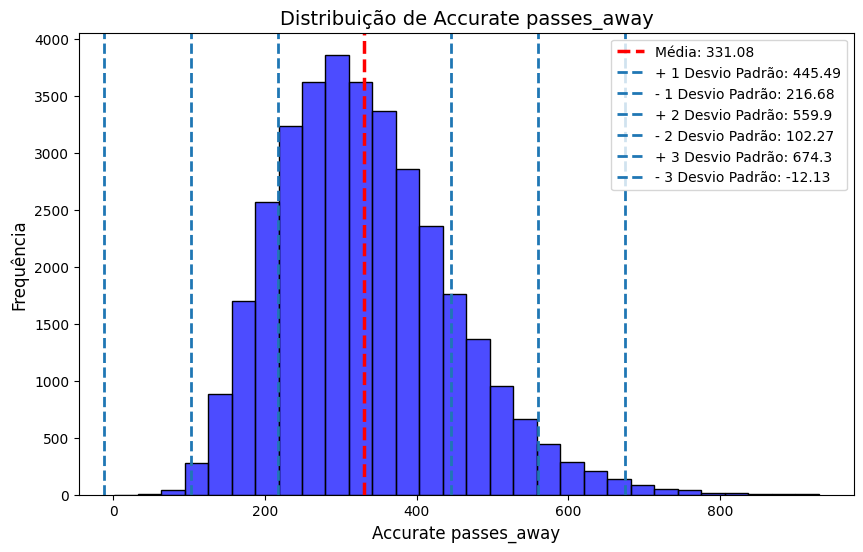

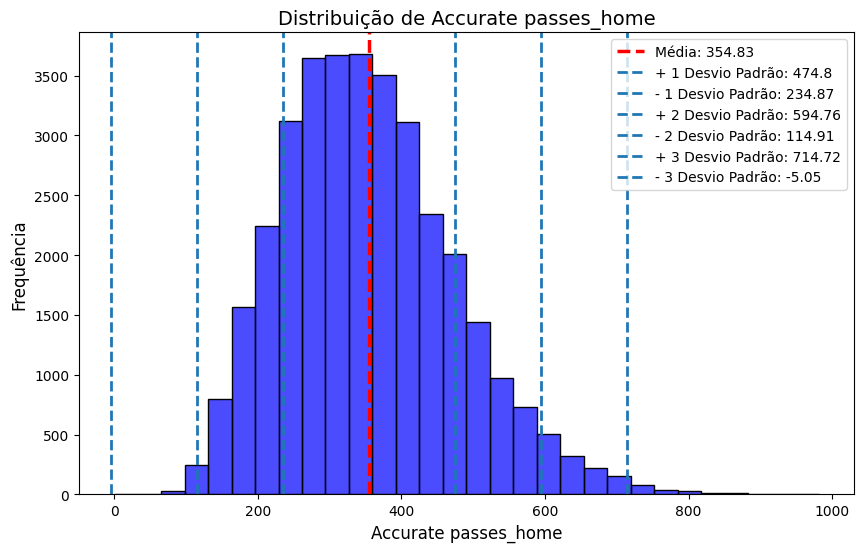

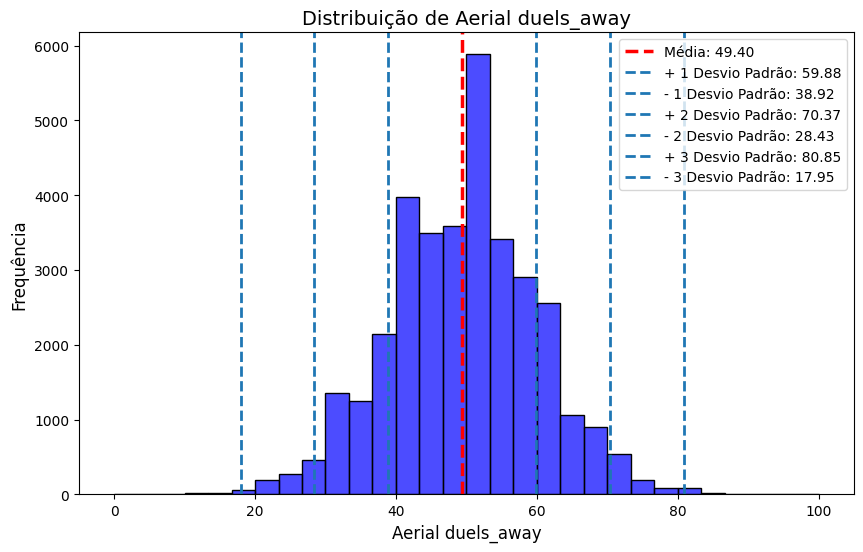

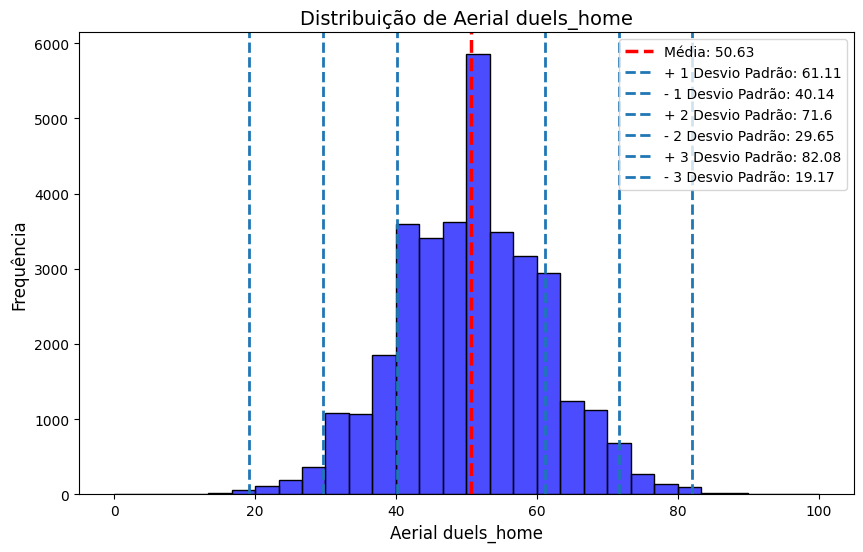

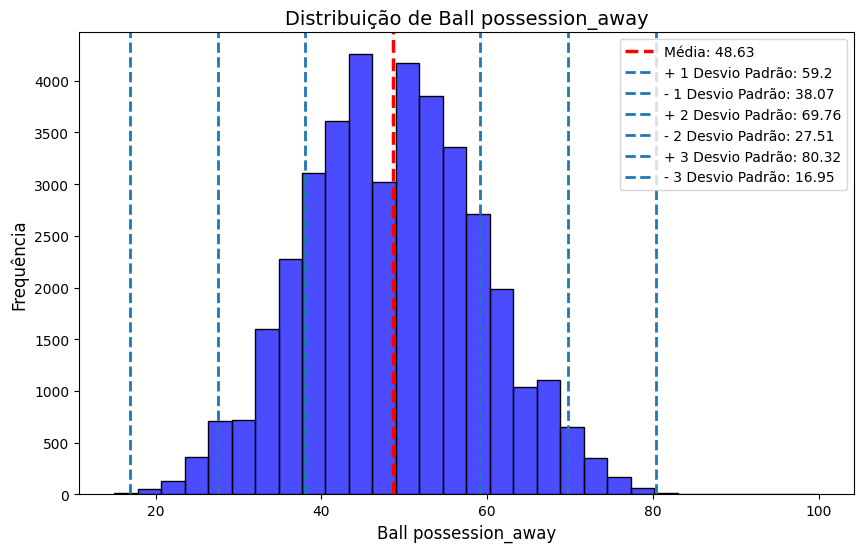

...

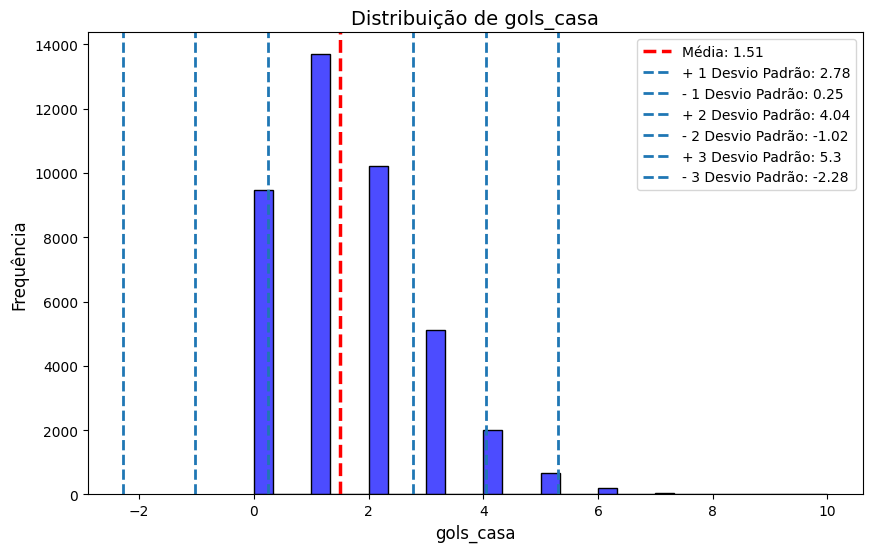

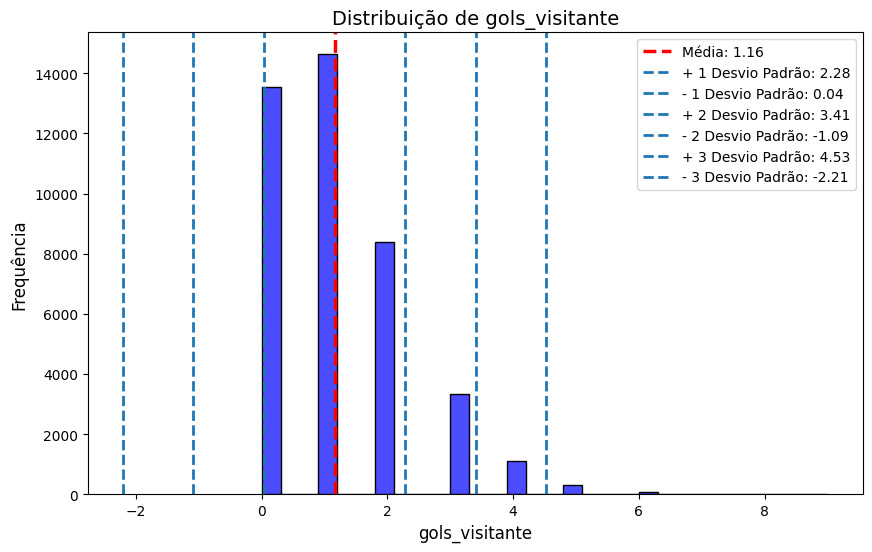

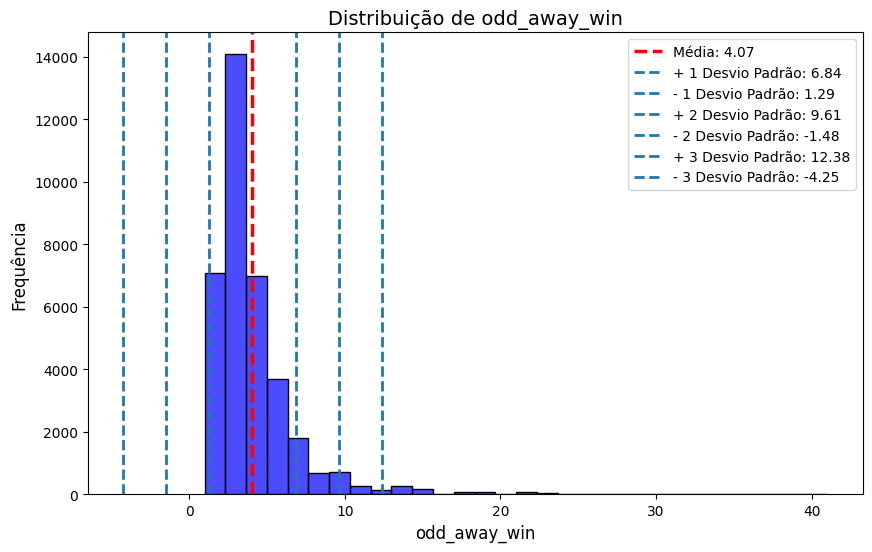

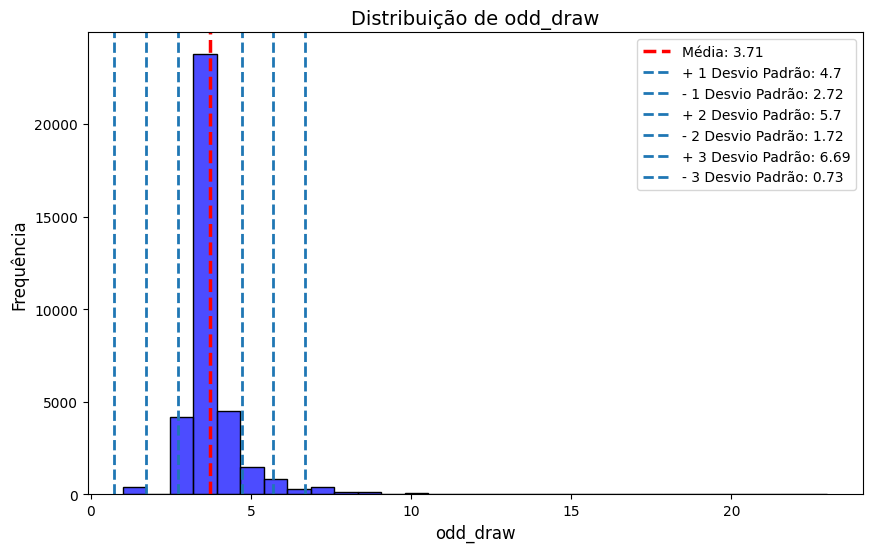

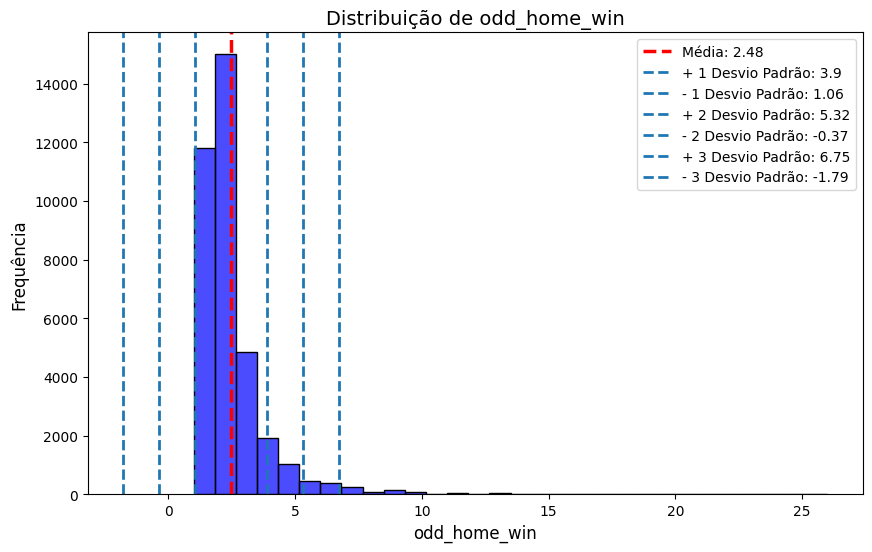

In [24]:
# Análise individual Numérica
colunas = df_geral_cols.select_dtypes(include=['float', 'int']).columns.to_frame().sort_values(by=0)[0].unique()

## Versão de gráficos para o TCC


for col in colunas:
    
    media = df_geral_cols[col].mean()
    desvio_padrao = df_geral_cols[col].std()
    
    # Cria o histograma
    plt.figure(figsize=(10, 6))
    sns.histplot(
        df_geral_cols[col], 
        # kde=True, 
        binwidth=(df_geral_cols[col].max() - df_geral_cols[col].min()) / 30,  # Ajusta a largura das barras
        color='blue', 
        alpha=0.7
    )
    
    # Adiciona uma linha vertical para a média
    plt.axvline(
        media, 
        color='red', 
        linestyle='--', 
        linewidth=2.5,  # Espessura da linha da média
        label=f"Média: {media:.2f}"
    )
    
    # Adiciona linhas para 1, 2 e 3 desvios padrão
    for i in range(1, 4):
        plt.axvline(
            media + i * desvio_padrao, 
            # color='auto', 
            linestyle='--', 
            linewidth=2, 
            label=f"+ {i} Desvio Padrão: {round(media + i * desvio_padrao,2)}"
        )
        plt.axvline(
            media - i * desvio_padrao, 
            # color='auto', 
            linestyle='--', 
            linewidth=2, 
            label=f"- {i} Desvio Padrão: {round(media - i * desvio_padrao,2)}"
        )
    
    # Títulos e legenda
    plt.title(f"Distribuição de {col}", fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Frequência", fontsize=12)
    plt.legend(fontsize=10)
    plt.show()





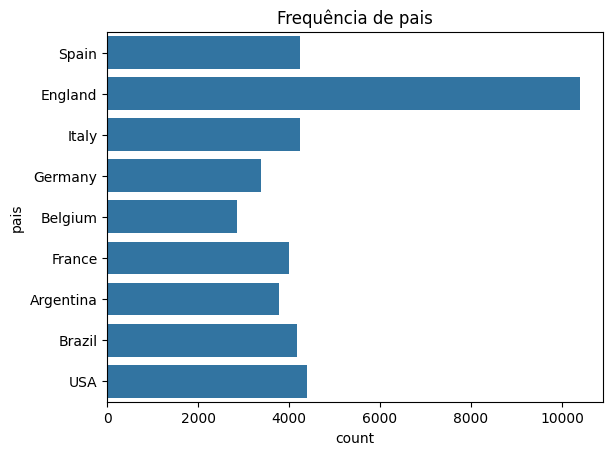

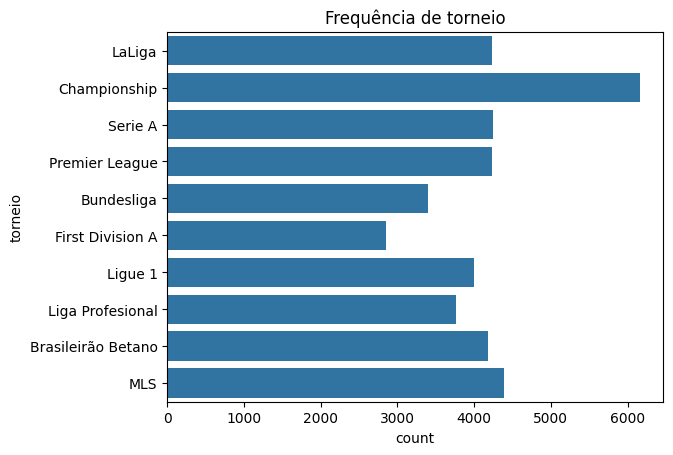

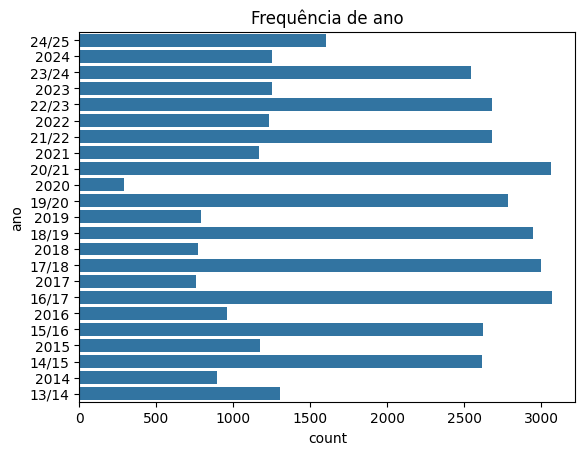

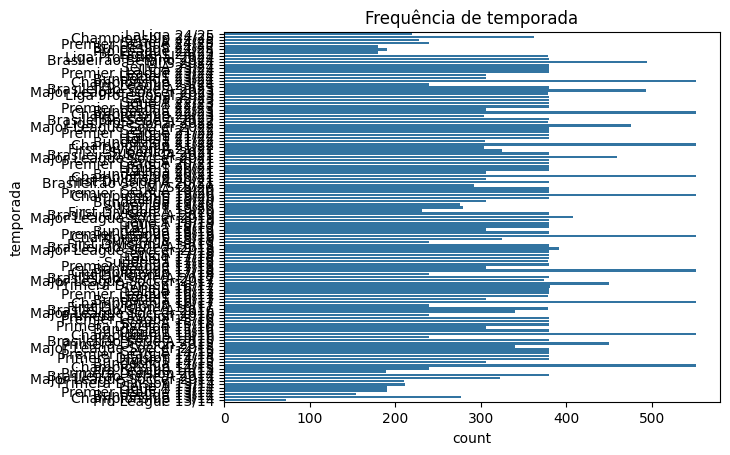

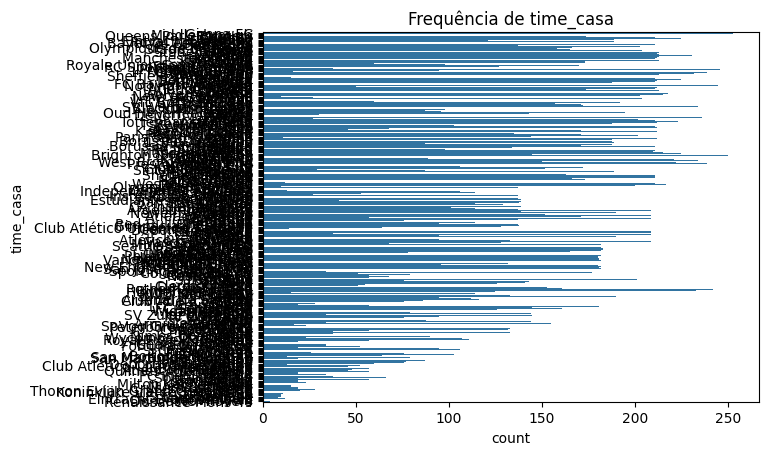

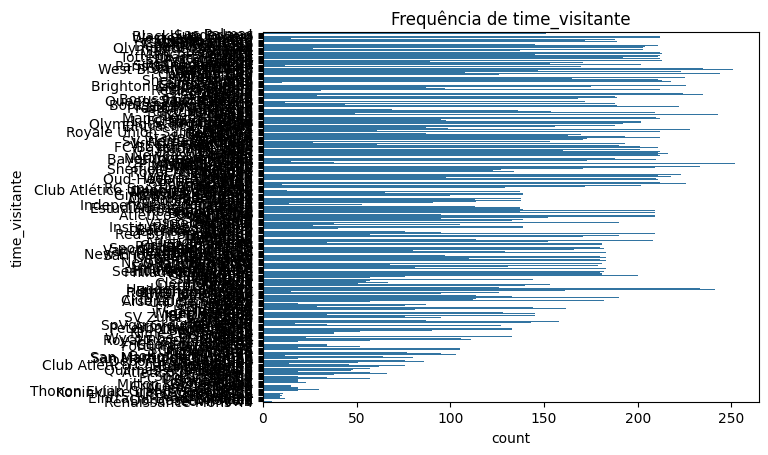

In [25]:
# Análise individual Categórica

for col in df_geral_cols.select_dtypes(include=['object', 'category']):
    sns.countplot(y= df_geral_cols[col])
    plt.title(f"Frequência de {col}")
    plt.show()


##### Avaliando percentual de vitoria e empate

In [26]:
# Definindo time vitorioso

dict_winner = {
    1:'Casa',
    0:'Empate',
    -1:'Visitante'
}


df_geral_cols['result'] = np.where(
    df_geral_cols['gols_casa'] > df_geral_cols['gols_visitante'], 1,
    np.where(
        df_geral_cols['gols_casa'] < df_geral_cols['gols_visitante'], -1, 0
    )
)


In [27]:
linhas

41427

In [28]:
df_vitoria = df_geral_cols.groupby(['result']).count()['data']
df_vitoria = df_vitoria.to_frame()
df_vitoria.columns = ['qtd']
df_vitoria['% win'] = (df_vitoria['qtd']/linhas)*100
df_vitoria = df_vitoria.reset_index()
df_vitoria['result'] = df_vitoria['result'].apply(lambda x: dict_winner[x])
df_vitoria

,result,qtd,% win
0,Visitante,11971,28.896613
1,Empate,10725,25.888913
2,Casa,18731,45.214474


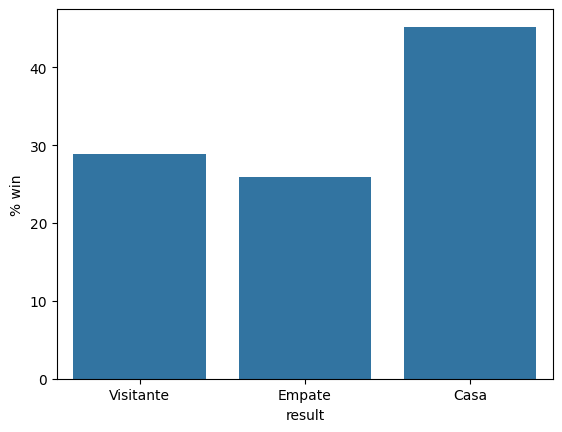

In [29]:
sns.barplot(data=df_vitoria,x=df_vitoria['result'],y=df_vitoria['% win'])
plt.show()

##### Nos jogos ja existe uma tendência do time da casa ganhar. Como um dos objetivos do modelo é ser suporte para as apostas e entenendo que os jogadores buscam lucro independente do resultado da partida, o trabalho será limitado a prever quando realizar um beck a favor do time da casa

In [30]:
# Portanto
df_geral_cols = df_geral_cols.drop(columns=['result'])

df_geral_cols['result'] = np.where(
    df_geral_cols['gols_casa'] > df_geral_cols['gols_visitante'], 
    1,
    0
)

df_vitoria = df_geral_cols.groupby(['result']).count()['data']
df_vitoria = df_vitoria.to_frame()
df_vitoria.columns = ['qtd']
df_vitoria['% win'] = (df_vitoria['qtd']/linhas)*100
df_vitoria = df_vitoria.reset_index()
df_vitoria

,result,qtd,% win
0,0,22696,54.785526
1,1,18731,45.214474


In [31]:
df_vitoria['qtd'].sum()

np.int64(41427)

### Análise dos nulos

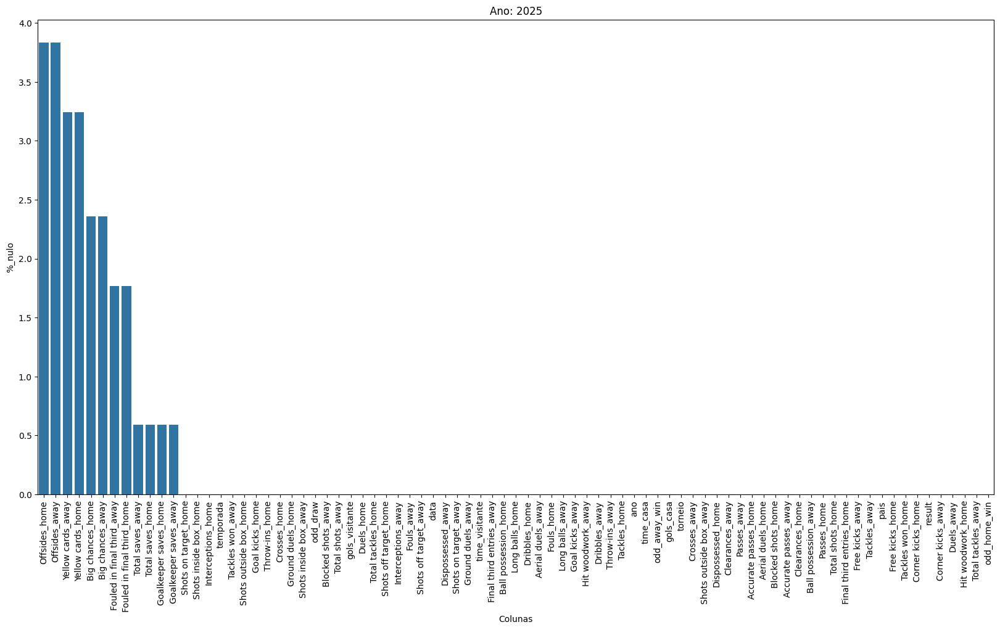

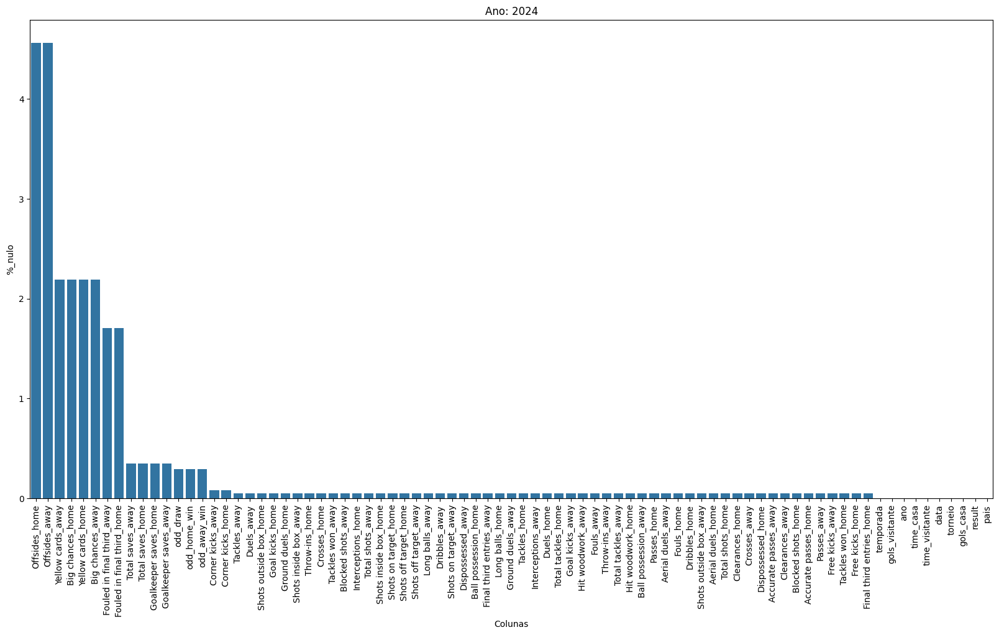

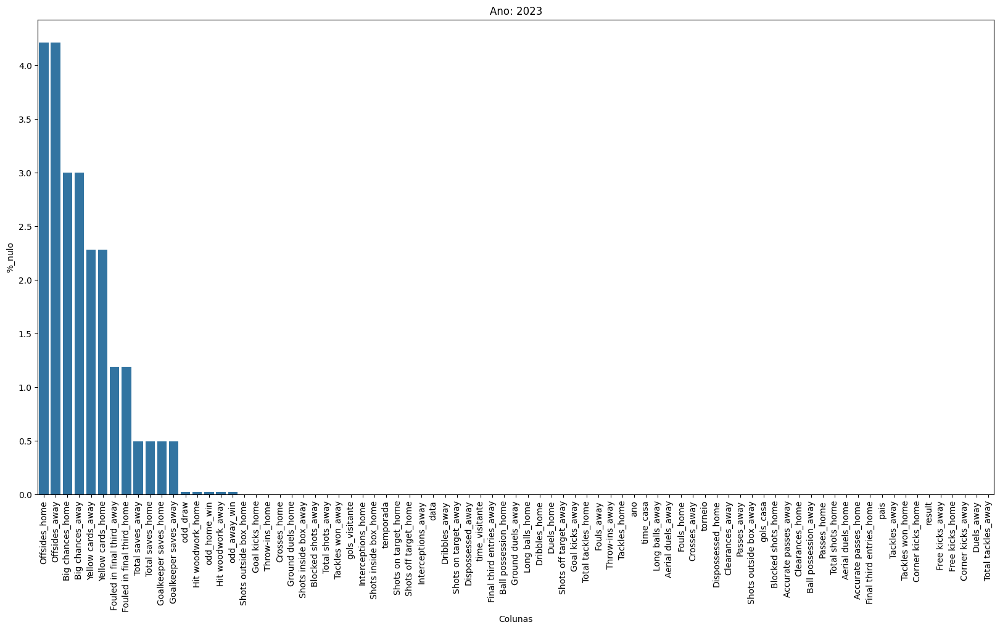

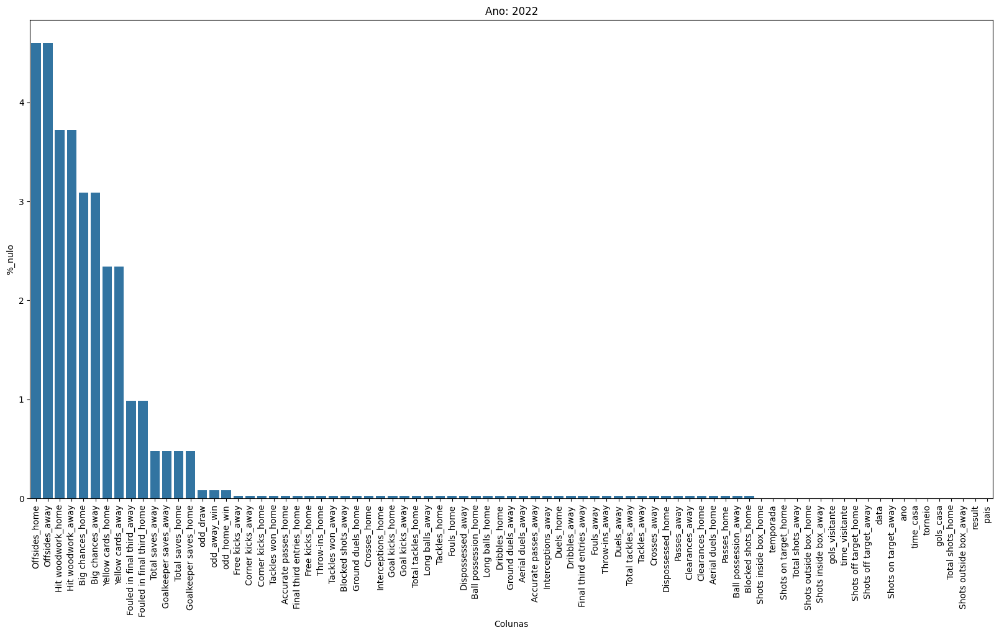

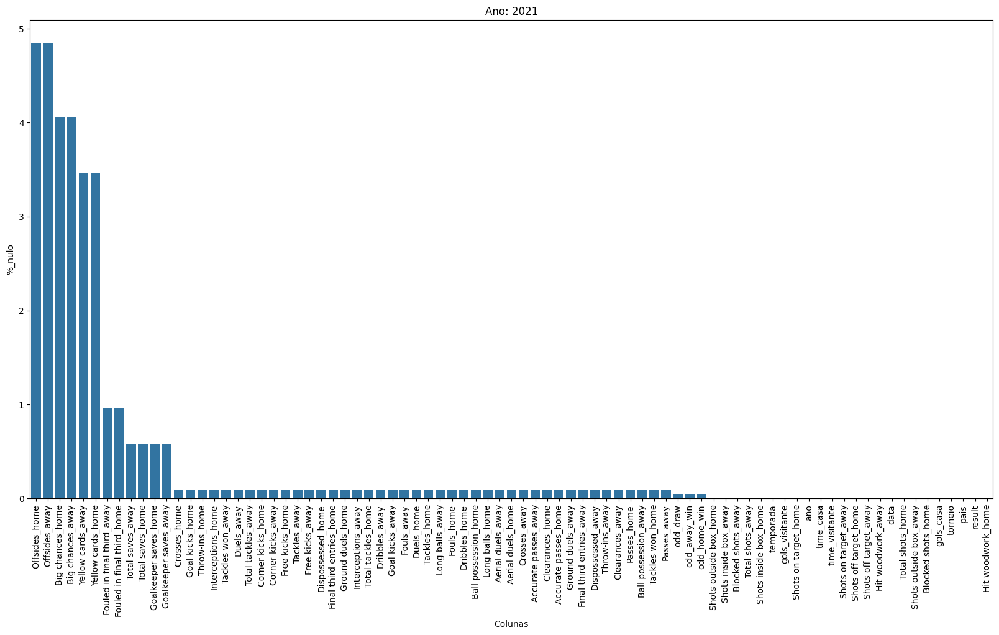

...

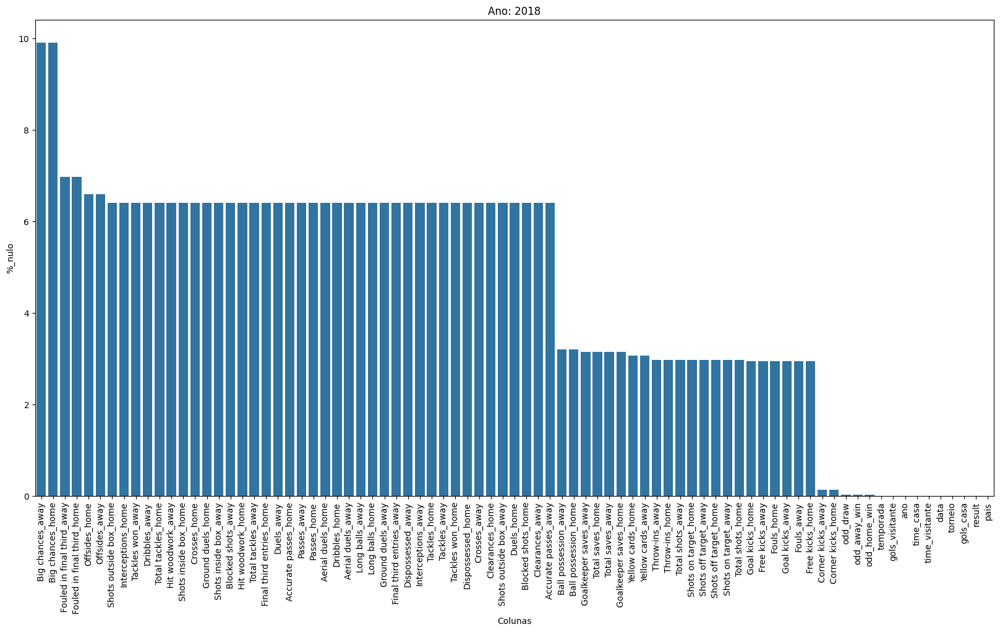

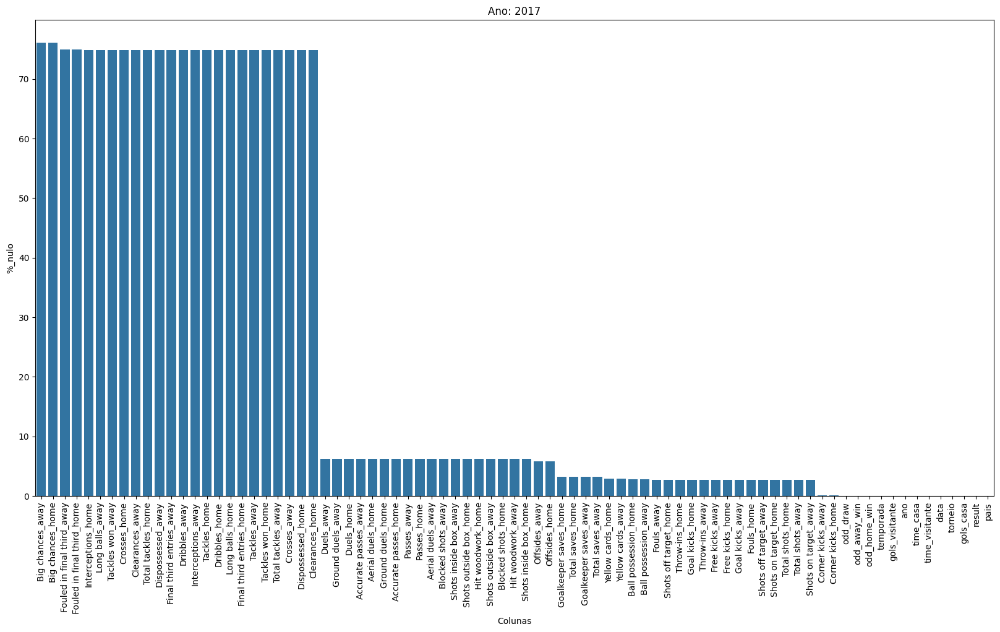

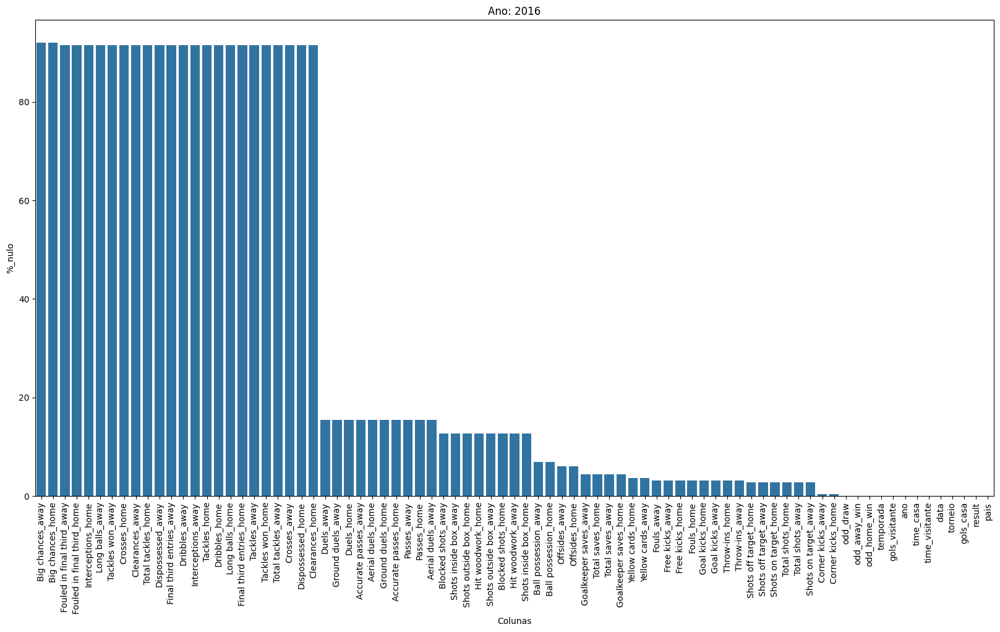

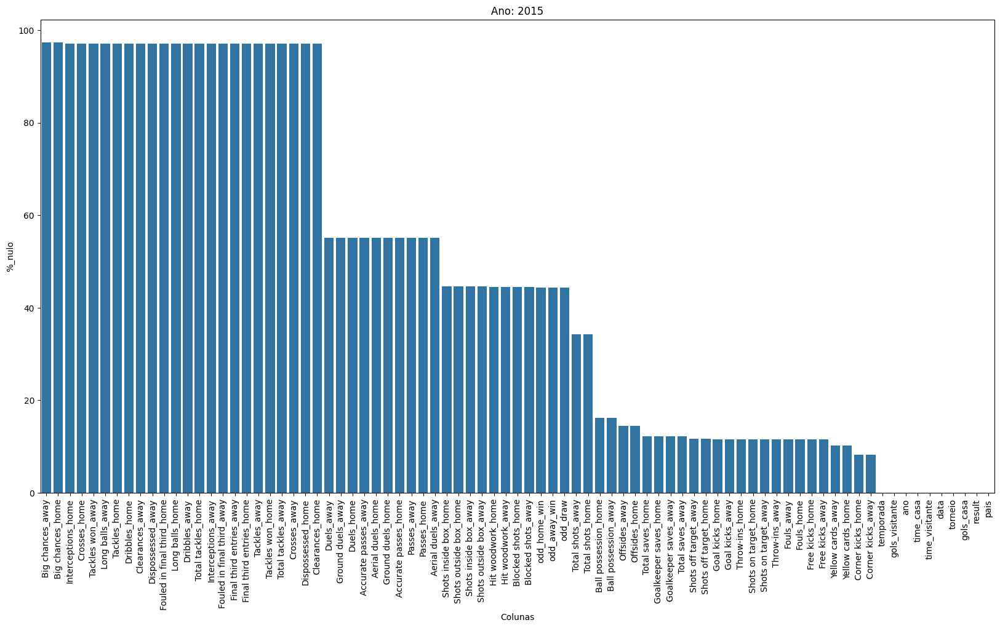

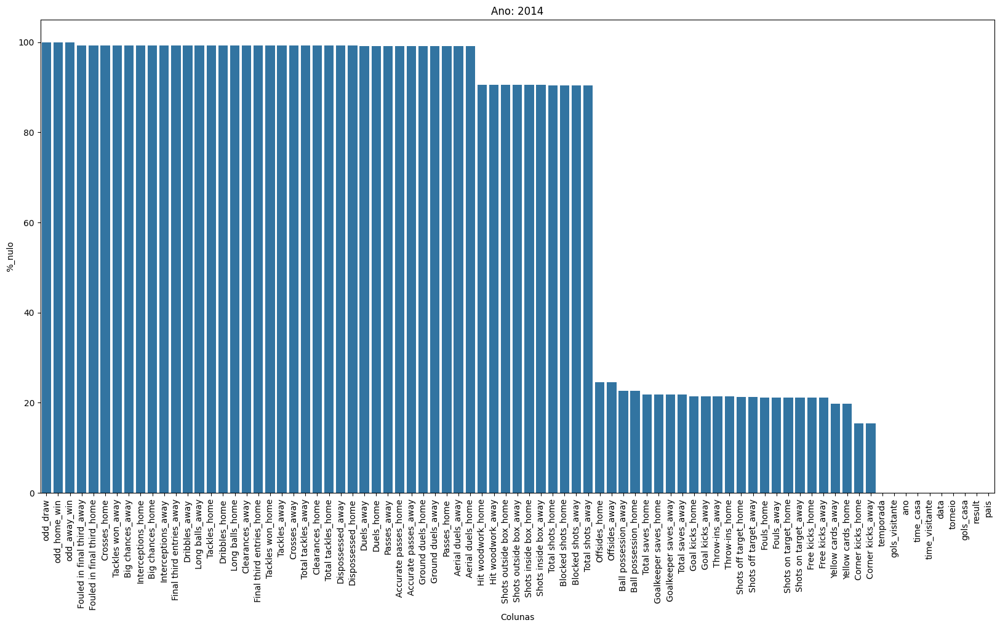

In [32]:
list_anos = df_geral_cols['data'].dt.year.unique()
colunas_to_keep = []
for ano in [2023, 2022, 2021, 2020, 2019]:
    df_2018 = df_geral_cols.copy()
    df_2018 = df_2018.loc[df_2018['data'].dt.year == ano]
    linhas = df_2018.shape[0]
    nulos_gerais_2018 = df_2018.isnull().sum()
    nulos_gerais_2018 = nulos_gerais_2018.sort_values(ascending=False)
    nulos_gerais_2018 = nulos_gerais_2018.to_frame()
    nulos_gerais_2018.columns = ['qtd_nula']
    nulos_gerais_2018['%_nulo'] = (nulos_gerais_2018['qtd_nula']/linhas)*100
    nulos_gerais_2018 = nulos_gerais_2018[nulos_gerais_2018['%_nulo'] <= 5]
    nulos_gerais_2018 = nulos_gerais_2018.reset_index()

    colunas_to_keep = colunas_to_keep + list(nulos_gerais_2018['index'].unique())
    
colunas_to_keep = list(set(colunas_to_keep))
# len(colunas_to_keep)

for ano in list_anos:
    df_geral_cols_nulos = df_geral_cols.copy()
    df_geral_cols_nulos = df_geral_cols_nulos[colunas_to_keep]

    linhas = df_geral_cols_nulos[df_geral_cols_nulos['data'].dt.year == ano].shape[0]
    nulos_gerais = df_geral_cols_nulos[df_geral_cols_nulos['data'].dt.year == ano].isnull().sum()
    nulos_gerais = nulos_gerais.sort_values(ascending=False)
    nulos_gerais = nulos_gerais.to_frame()
    nulos_gerais.columns = ['qtd_nula']
    nulos_gerais['%_nulo'] = (nulos_gerais['qtd_nula']/linhas)*100


    plt.figure(figsize=(20,10))
    sns.barplot(data=nulos_gerais,x=nulos_gerais.index,y=nulos_gerais['%_nulo'])
    # plt.bar(x=nulos_gerais.index,height=nulos_gerais['qtd_nula'])
    plt.xticks(rotation=90)
    plt.xlabel('Colunas')
    plt.title(f'Ano: {ano}')
    plt.show()

In [33]:
np.linspace(2014,2025,2025-2014 + 1)

array([2014., 2015., 2016., 2017., 2018., 2019., 2020., 2021., 2022.,
       2023., 2024., 2025.])

In [34]:
nulos_acumulado = []

for ano in np.linspace(2014,2025,2025-2014 + 1):

    df_2018 = df_geral_cols.copy()
    df_2018 = df_2018.loc[df_2018['data'].dt.year <= ano]
    linhas = df_2018.shape[0]
    colunas = df_2018.shape[1]

    instancias = linhas * colunas
    nulos_gerais_2018 = df_2018.isnull().sum()

    nulo = (nulos_gerais_2018.sum()/instancias)*100

    nulos_acumulado.append([ano,nulo])
    

# print(f'Percentual de nulos em anos inferiroes a 2018: {nulo:.2f}%')

In [35]:
nulos_acumulado

[[np.float64(2014.0), np.float64(71.38623489280256)],
 [np.float64(2015.0), np.float64(64.94104942380804)],
 [np.float64(2016.0), np.float64(59.26319379829816)],
 [np.float64(2017.0), np.float64(54.917882831561535)],
 [np.float64(2018.0), np.float64(48.90374970606036)],
 [np.float64(2019.0), np.float64(45.13616769782314)],
 [np.float64(2020.0), np.float64(42.71279001008731)],
 [np.float64(2021.0), np.float64(39.958001052565464)],
 [np.float64(2022.0), np.float64(37.91563135825431)],
 [np.float64(2023.0), np.float64(35.80990004224518)],
 [np.float64(2024.0), np.float64(33.616750512194436)],
 [np.float64(2025.0), np.float64(33.41112131031749)]]

In [36]:
df_2018 = df_geral_cols.copy()
df_2018 = df_2018.loc[df_2018['data'].dt.year >= 2018]
linhas = df_2018.shape[0]
colunas = df_2018.shape[1]

instancias = linhas * colunas
nulos_gerais_2018 = df_2018.isnull().sum()

nulo = (nulos_gerais_2018.sum()/instancias)*100

print(f'Percentual de nulos em anos posteriores a 2018: {nulo:.2f}%')

Percentual de nulos em anos posteriores a 2018: 21.30%


In [37]:
df_2018.shape

(26506, 111)

In [38]:
display(df_2018.groupby(['torneio']).size())

torneio
Brasileirão Betano    2660
Bundesliga            2168
Championship          3925
First Division A      1889
LaLiga                2711
Liga Profesional      2273
Ligue 1               2475
MLS                   3013
Premier League        2692
Serie A               2700
dtype: int64

In [83]:
df_vitoria = df_2018.groupby(['result']).count()['data']
df_vitoria = df_vitoria.to_frame()
df_vitoria.columns = ['qtd']
df_vitoria['% win'] = (df_vitoria['qtd']/linhas)*100
df_vitoria = df_vitoria.reset_index()
df_vitoria

,result,qtd,% win
0,0,14712,55.504414
1,1,11794,44.495586


### Base sem os nulos

In [40]:
df_geral_cols_not_null = df_geral_cols.copy()
df_geral_cols_not_null.shape

(41427, 111)

In [41]:
cols_keep = ['torneio','Corner kicks_home','Blocked shots_home','Goalkeeper saves_away','Ground duels_home','Big chances_away',
                    'Interceptions_home','Ground duels_away','Aerial duels_home','Free kicks_away','Crosses_home','Total saves_home',
                    'Duels_home','Shots on target_away','Clearances_home','Passes_away','time_visitante','Crosses_away','Hit woodwork_home',
                    'temporada','Tackles_home','Big chances_home','Fouls_home','Aerial duels_away','Tackles won_home',
                    'Long balls_home','Passes_home','Offsides_home', 'Total shots_away','Yellow cards_home','Dribbles_away','Shots inside box_away','Blocked shots_away',
                    'Goal kicks_away','Shots outside box_home','Long balls_away','Shots inside box_home','Shots off target_away','Hit woodwork_away','Ball possession_away',
                    'Shots outside box_away','Tackles won_away','Accurate passes_home','Tackles_away','ano','Free kicks_home','Interceptions_away','Shots on target_home',
                    'Throw-ins_home', 'Yellow cards_away', 'Total shots_home','Shots off target_home','Ball possession_home', 'gols_casa','Total saves_away','odd_draw','data',
                    'Fouled in final third_home','Total tackles_away','Dribbles_home','Fouls_away','Goalkeeper saves_home','gols_visitante','Final third entries_home',
                    'Final third entries_away', 'Dispossessed_home','Throw-ins_away','Goal kicks_home','Corner kicks_away','odd_away_win','Clearances_away','pais',
                    'Fouled in final third_away','Dispossessed_away','Duels_away','Offsides_away','odd_home_win','Accurate passes_away','time_casa','Total tackles_home']

df_geral_cols_not_null = df_geral_cols_not_null[df_geral_cols_not_null['data'].dt.year >= 2018]
df_geral_cols_not_null = df_geral_cols_not_null[df_geral_cols_not_null['temporada'].str.contains('17') == False]

df_engenharia_not_null = df_geral_cols_not_null.copy()

df_engenharia_not_null = df_engenharia_not_null[cols_keep]


In [42]:
df_engenharia_not_null.shape

(25049, 80)

In [ ]:
df_desempenho_not_null = Engenharia().desempenho(df_engenharia_not_null,5,False)
df_desempenho_not_null.shape

(43198, 39)

In [44]:
df_match_performance_not_null = Engenharia().match_performance(df_geral_cols_not_null,df_desempenho_not_null,False)
df_match_performance_not_null.shape

(21513, 81)

In [45]:
df_ratio_not_null = Engenharia().ratio(df_match_performance_not_null,df_desempenho_not_null,False)
df_ratio_not_null.shape

(21513, 46)

In [ ]:
# colunas a serem dropadas
cols_drop = ['data','pais','temporada','ano','torneio','home_team','away_team','odd_home_win','odd_draw','odd_away_win']

# Train e Test
df_train_not_null = df_ratio_not_null.copy()
df_train_not_null = df_train_not_null.loc[(df_train_not_null['ano'].str.contains('24/25') == False) &
                        (df_train_not_null['ano'].str.contains('2024') == False) & (df_train_not_null['ano'].str.contains('2025') == False)]

df_train_not_null = df_train_not_null.drop(columns=cols_drop)

df_test_not_null = df_ratio_not_null.copy()
df_test_not_null = df_test_not_null.loc[df_test_not_null['ano'].str.contains('24/25') |
                    df_test_not_null['ano'].str.contains('2024') | df_test_not_null['ano'].str.contains('2025')]

df_test_not_null = df_test_not_null.drop(columns=cols_drop)


print('Treino')
display(df_train_not_null.groupby(['result']).size())

print('Teste')
display(df_test_not_null.groupby(['result']).size())

Treino


result
0    10608
1     8497
dtype: int64

Teste


result
0    1326
1    1082
dtype: int64

### Testando diferentes modelos de classificação sem nulos

In [47]:
# Separando a base de validação
x_train_not_null = df_train_not_null.copy().drop(columns=['result'])
x_test_not_null = df_test_not_null.copy().drop(columns=['result'])
y_train_not_null = df_train_not_null.copy()[['result']]
y_test_not_null = df_test_not_null.copy()[['result']]

In [48]:
x_test_not_null.columns

Index(['Accurate passes_ratio', 'Aerial duels_ratio', 'Ball possession_ratio',
       'Big chances_ratio', 'Blocked shots_ratio', 'Clearances_ratio',
       'Corner kicks_ratio', 'Crosses_ratio', 'Dispossessed_ratio',
       'Dribbles_ratio', 'Duels_ratio', 'Final third entries_ratio',
       'Fouled in final third_ratio', 'Fouls_ratio', 'Free kicks_ratio',
       'Goal kicks_ratio', 'Goalkeeper saves_ratio', 'Ground duels_ratio',
       'Hit woodwork_ratio', 'Interceptions_ratio', 'Long balls_ratio',
       'Offsides_ratio', 'Passes_ratio', 'Shots inside box_ratio',
       'Shots off target_ratio', 'Shots on target_ratio',
       'Shots outside box_ratio', 'Tackles_ratio', 'Tackles won_ratio',
       'Throw-ins_ratio', 'Total saves_ratio', 'Total shots_ratio',
       'Total tackles_ratio', 'Yellow cards_ratio', 'gols_ratio'],
      dtype='object')

#### Árvore de decisão: One vs Rest - HOME NOTNULL

In [49]:
# Definindo parametros e treinamento
tree_model_not_null = DecisionTreeClassifier(random_state=42)
tree_model_not_null.fit(x_train_not_null,y_train_not_null)

# Realizando a predição
y_predict_not_null = tree_model_not_null.predict(x_test_not_null)

# Realizando a Matriz Confusão
matrix_not_null = confusion_matrix(y_test_not_null,y_predict_not_null)


# Imporrtancia de cada variável
importancia_not_null = tree_model_not_null.feature_importances_
features_not_null = df_train_not_null.drop(columns=['result']).columns

df_importancia_not_null = pd.DataFrame([features_not_null,importancia_not_null]).T
df_importancia_not_null.columns = ['feature','importancia']
df_importancia_not_null= df_importancia_not_null.sort_values(by='importancia',ascending=False)
df_importancia_not_null['%'] = df_importancia_not_null['importancia'] * 100

display(df_importancia_not_null)

matriz_not_null = confusion_matrix(y_test_not_null, y_predict_not_null)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')

precision_tree_home_not_null = precision_not_null
recall_tree_home_not_null = recall_not_null
accuracy_tree_home_not_null = accuracy_not_null

,feature,importancia,%
0,Accurate passes_ratio,0.047113,4.711278
2,Ball possession_ratio,0.036677,3.667695
25,Shots on target_ratio,0.036591,3.659096
15,Goal kicks_ratio,0.036157,3.615725
23,Shots inside box_ratio,0.034973,3.49731
14,Free kicks_ratio,0.03459,3.458998
19,Interceptions_ratio,0.033546,3.354649
21,Offsides_ratio,0.032852,3.285212
20,Long balls_ratio,0.032258,3.225752
3,Big chances_ratio,0.032238,3.223767


Matriz confusão:
[[774 552]
 [544 538]]
Precision: 0.4936
Recall: 0.4972
Accuracy: 0.5449


#### Random Forest: One vs Rest - HOME NOTNULL

In [50]:
# Criar e treinar modelo
rf_not_null = RandomForestClassifier(n_estimators=100, random_state=42)
rf_not_null.fit(x_train_not_null, y_train_not_null)

# Fazer previsões
y_pred_not_null = rf_not_null.predict(x_test_not_null)

# Avaliar modelo
matriz_not_null = confusion_matrix(y_test_not_null, y_pred_not_null)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')

precision_rf_home_not_null = precision_not_null
recall_rf_home_not_null = recall_not_null
accuracy_rf_home_not_null = accuracy_not_null

Matriz confusão:
[[1005  321]
 [ 637  445]]
Precision: 0.5809
Recall: 0.4113
Accuracy: 0.6022


#### LightGBM: One vs Rest - HOME NOTNULL

In [ ]:
# Criando Dataset LightGBM
train_data_not_null = lgb.Dataset(x_train_not_null, label=y_train_not_null)
test_data_not_null = lgb.Dataset(x_test_not_null, label=y_test_not_null, reference=train_data_not_null)

# Definindo hiperparâmetros
params_not_null = {
    'objective': 'binary', 
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',  
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9
}

# Treinamento do modelo
model_not_null = lgb.train(params_not_null, train_data_not_null, num_boost_round=100, valid_sets=[test_data_not_null])


# Previsões
y_pred_not_null = model_not_null.predict(x_test_not_null)
y_pred_class_not_null = [1 if x > 0.5 else 0 for x in y_pred_not_null]

# Avaliação
matriz_not_null = confusion_matrix(y_test_not_null, y_pred_class_not_null)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')

precision_lightgbm_home_not_null = precision_not_null
recall_lightgbm_home_not_null = recall_not_null
accuracy_lightgbm_home_not_null = accuracy_not_null

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 8497, number of negative: 10608
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8479
[LightGBM] [Info] Number of data points in the train set: 19105, number of used features: 35
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.444753 -> initscore=-0.221895
[LightGBM] [Info] Start training from score -0.221895
Matriz confusão:
[[1026  300]
 [ 642  440]]
Precision: 0.5946
Recall: 0.4067
Accuracy: 0.6088


#### XGBoost: One vs Rest - HOME NOTNULL

In [52]:
# Criando o DMatrix para XGBoost
train_data_not_null = xgb.DMatrix(x_train_not_null, label=y_train_not_null)
test_data_not_null = xgb.DMatrix(x_test_not_null, label=y_test_not_null)

# Definição dos hiperparâmetros
params_not_null = {
    'objective': 'binary:logistic',  
    'eval_metric': 'logloss',        
    'max_depth': 6,                  
    'learning_rate': 0.05,           
    'n_estimators': 100,             
}

# Treinamento
model_not_null = xgb.train(params_not_null, train_data_not_null, num_boost_round=100, evals=[(test_data_not_null, "Test")], early_stopping_rounds=10)

# Previsão
y_pred_not_null = model_not_null.predict(test_data_not_null)
y_pred_class_not_null= [1 if x > 0.5 else 0 for x in y_pred_not_null]

# Avaliação
matriz_not_null = confusion_matrix(y_test_not_null, y_pred_class_not_null)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')

precision_xgboost_home_not_null = precision_not_null
recall_xgboost_home_not_null = recall_not_null
accuracy_xgboost_home_not_null = accuracy_not_null


[0]	Test-logloss:0.68519
[1]	Test-logloss:0.68254
[2]	Test-logloss:0.68008
[3]	Test-logloss:0.67817
[4]	Test-logloss:0.67636
[5]	Test-logloss:0.67475
[6]	Test-logloss:0.67333
[7]	Test-logloss:0.67180
[8]	Test-logloss:0.67038
[9]	Test-logloss:0.66942
[10]	Test-logloss:0.66843
[11]	Test-logloss:0.66729
[12]	Test-logloss:0.66631
[13]	Test-logloss:0.66559
[14]	Test-logloss:0.66471
[15]	Test-logloss:0.66409
[16]	Test-logloss:0.66361
[17]	Test-logloss:0.66316
[18]	Test-logloss:0.66272
[19]	Test-logloss:0.66229
[20]	Test-logloss:0.66185
[21]	Test-logloss:0.66150
[22]	Test-logloss:0.66122
[23]	Test-logloss:0.66099
[24]	Test-logloss:0.66081
[25]	Test-logloss:0.66045
[26]	Test-logloss:0.66025
[27]	Test-logloss:0.65978
[28]	Test-logloss:0.65976
[29]	Test-logloss:0.65975
[30]	Test-logloss:0.65956
[31]	Test-logloss:0.65929
[32]	Test-logloss:0.65936
[33]	Test-logloss:0.65925
[34]	Test-logloss:0.65897
[35]	Test-logloss:0.65876
[36]	Test-logloss:0.65869
[37]	Test-logloss:0.65859
[38]	Test-logloss:0.65

#### Comparação dos indicadores

In [ ]:
matriz_resultado =[
                    ['tree','s/nan',precision_tree_home_not_null,recall_tree_home_not_null,accuracy_tree_home_not_null],
                    ['lightGBM','s/nan',precision_lightgbm_home_not_null,recall_lightgbm_home_not_null,accuracy_lightgbm_home_not_null],
                    ['random forest','s/nan',precision_rf_home_not_null,recall_rf_home_not_null,accuracy_rf_home_not_null],
                    ['xgboost','s/nan',precision_xgboost_home_not_null,recall_xgboost_home_not_null,accuracy_xgboost_home_not_null]
                                    ]


df_matriz_resultado = pd.DataFrame(matriz_resultado,columns=['model', 'analise', 'precision', 'recall', 'accuracy'])
df_matriz_resultado = df_matriz_resultado.sort_values(by=['model','precision'],ascending=False)
df_matriz_resultado

,model,analise,precision,recall,accuracy
3,xgboost,s/nan,0.588076,0.401109,0.604651
0,tree,s/nan,0.493578,0.497227,0.544850
2,random forest,s/nan,0.580940,0.411275,0.602159
1,lightGBM,s/nan,0.594595,0.406654,0.608804


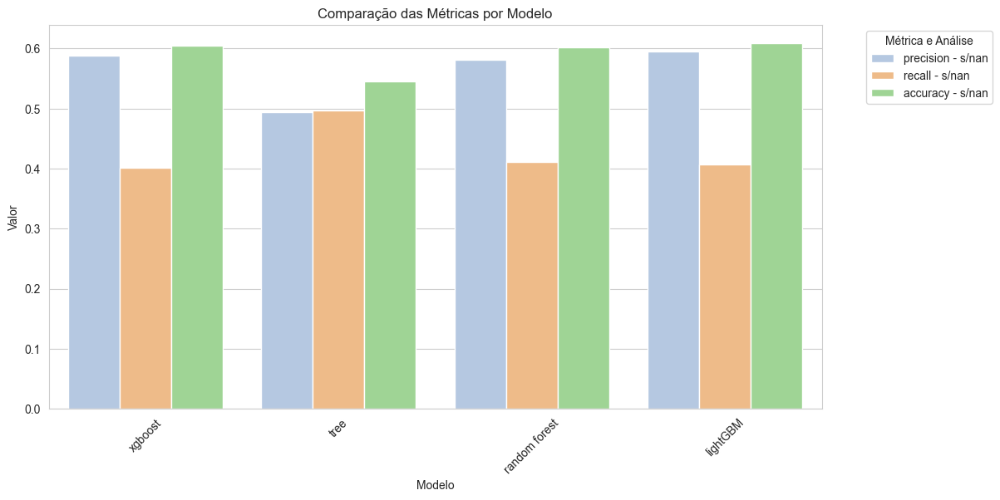

In [54]:
# Configuração do estilo
sns.set_style("whitegrid")

# Transformação dos dados para visualização
df_melted = df_matriz_resultado.melt(id_vars=['model', 'analise'], value_vars=['precision', 'recall', 'accuracy'])

# Criar uma nova coluna combinada para hue
df_melted['hue_label'] = df_melted['variable'] + " - " + df_melted['analise']

# Definição de cores fixas para cada métrica e análise
color_map = {
    'precision - c/nan': '#1f77b4', 'precision - s/nan': '#aec7e8',  # Azul
    'recall - c/nan': '#ff7f0e', 'recall - s/nan': '#ffbb78',       # Laranja
    'accuracy - c/nan': '#2ca02c', 'accuracy - s/nan': '#98df8a'    # Verde
}

# Aplicar cores ao gráfico
plt.figure(figsize=(12, 6))
sns.barplot(
    data=df_melted, 
    x='model', 
    y='value', 
    hue='hue_label',  
    palette=color_map,  # Usa as cores definidas no dicionário
    dodge=True  
)
plt.xticks(rotation=45)
plt.title('Comparação das Métricas por Modelo')
plt.ylabel('Valor')
plt.xlabel('Modelo')
plt.legend(title='Métrica e Análise', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### Aplicando otmizações nos modelos 

#### Arvores de decisão - GridSearchCV

In [ ]:
# Hiperparâmetros
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}


tree_model = DecisionTreeClassifier(random_state=42)

# Busca pelos melhores hiperparâmetros
grid_search = GridSearchCV(tree_model, param_grid, cv=5, scoring='precision', n_jobs=-1)
grid_search.fit(x_train_not_null, y_train_not_null)

# Melhor modelo encontrado
best_tree_model_grid_search_cv = grid_search.best_estimator_

# Predição com o melhor modelo
y_predict_best = best_tree_model_grid_search_cv.predict(x_test_not_null)

# Avaliação
matriz_not_null = confusion_matrix(y_test_not_null, y_predict_best)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')

precision_tree_home_not_null_grid_search_cv = precision_not_null
recall_tree_home_not_null_grid_search_cv= recall_not_null
accuracy_tree_home_not_null_grid_search_cv = accuracy_not_null

Matriz confusão:
[[921 405]
 [570 512]]
Precision: 0.5583
Recall: 0.4732
Accuracy: 0.5951


#### Random Forest - GridSeachCV

In [ ]:
# Hiperaparâmetros
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],  
    'min_samples_split': [2, 5, 10], 
    'min_samples_leaf': [1, 2, 4],  
    'max_features': ['sqrt', 'log2'] 
}

# Criar modelo
rf = RandomForestClassifier(random_state=42)

# Grid Search com validação cruzada
grid_search = GridSearchCV(rf, param_grid, cv=5, scoring='precision', n_jobs=-1, verbose=1)
grid_search.fit(x_train_not_null, y_train_not_null)

# Melhor modelo
best_rf_grid_seach_cv = grid_search.best_estimator_

# Fazer previsões
y_pred_not_null = best_rf_grid_seach_cv.predict(x_test_not_null)

# Avaliação
matriz_not_null = confusion_matrix(y_test_not_null, y_pred_not_null)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')

precision_rf_home_not_null_grid_search_cv = precision_not_null
recall_rf_home_not_null_grid_search_cv = recall_not_null
accuracy_rf_home_not_null_grid_search_cv = accuracy_not_null

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Matriz confusão:
[[1040  286]
 [ 668  414]]
Precision: 0.5914
Recall: 0.3826
Accuracy: 0.6038


#### LightGBM - GridSearchCV

In [ ]:
# Modelo
lgbm = lgb.LGBMClassifier(objective='binary', metric='binary_logloss', boosting_type='gbdt',random_state=42)

# Hiperparâmetros
param_grid = {
    'num_leaves': [31, 50, 100, 150],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'feature_fraction': [0.7, 0.8, 0.9],
    'bagging_fraction': [0.7, 0.8, 0.9],
    'max_depth': [-1, 5, 10, 15],
    'n_estimators': [100, 200, 300]
}

# Definindo o GridSearchCV
grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, cv=3, verbose=1, n_jobs=-1,scoring='precision')

# Treinando o modelo com a busca em grade
grid_search.fit(x_train_not_null, y_train_not_null)

# Imprimindo os melhores parâmetros encontrados
print(f'Melhores parâmetros: {grid_search.best_params_}')

# Usando o modelo otimizado
model_lightGBM_grid_search_cv = grid_search.best_estimator_

# Previsões no conjunto de teste
y_pred_not_null = model_lightGBM_grid_search_cv.predict(x_test_not_null)
y_pred_class_not_null = [1 if x > 0.5 else 0 for x in y_pred_not_null]

# Avaliação
matriz_not_null = confusion_matrix(y_test_not_null, y_pred_class_not_null)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')

precision_lightgbm_home_not_null_grid_search_cv = precision_not_null
recall_lightgbm_home_not_null_grid_search_cv = recall_not_null
accuracy_lightgbm_home_not_null_grid_search_cv = accuracy_not_null

Fitting 3 folds for each of 1728 candidates, totalling 5184 fits
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Number of positive: 8497, number of negative: 10608
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8479
[LightGBM] [Info] Number of data points in the train set: 19105, number of used features: 35
[LightGBM] [In

#### XGBoost - GridSearchCV

In [ ]:
# Modelo
xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False, random_state=42)

# Hiperparâmetros
param_grid = {
    'max_depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 1, 5]
}

# Configuração do GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='precision', cv=3, verbose=1, n_jobs=-1)

# Executando a busca
grid_search.fit(x_train_not_null, y_train_not_null)

# Melhor modelo encontrado
best_model_xgboost_grid_search_cv = grid_search.best_estimator_
print("Melhores hiperparâmetros encontrados:", grid_search.best_params_)

# Avaliação no conjunto de teste
y_pred_grid = best_model_xgboost_grid_search_cv.predict(x_test_not_null)

# Avaliando
matriz_not_null = confusion_matrix(y_test_not_null, y_pred_grid)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')

precision_xgboost_home_not_null_grid_search_cv = precision_not_null
recall_xgboost_home_not_null_grid_search_cv = recall_not_null
accuracy_xgboost_home_not_null_grid_search_cv = accuracy_not_null

Fitting 3 folds for each of 324 candidates, totalling 972 fits
Melhores hiperparâmetros encontrados: {'colsample_bytree': 1.0, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.8}
Matriz confusão:
[[1133  193]
 [ 770  312]]
Precision: 0.6178
Recall: 0.2884
Accuracy: 0.6001


#### Avaliação das comparações

In [59]:

list_melhorias = [

['tree','raw',precision_tree_home_not_null,recall_tree_home_not_null,accuracy_tree_home_not_null],
['tree','grid search cv',precision_tree_home_not_null_grid_search_cv,recall_tree_home_not_null_grid_search_cv,accuracy_tree_home_not_null_grid_search_cv],

['random forest','raw',precision_rf_home_not_null,recall_rf_home_not_null,accuracy_rf_home_not_null],
['random forest','grid search cv',precision_rf_home_not_null_grid_search_cv,recall_rf_home_not_null_grid_search_cv,accuracy_rf_home_not_null_grid_search_cv],

['lightGBM','raw',precision_lightgbm_home_not_null,recall_lightgbm_home_not_null,accuracy_lightgbm_home_not_null],
['lightGBM','grid search cv',precision_lightgbm_home_not_null_grid_search_cv,recall_lightgbm_home_not_null_grid_search_cv,accuracy_lightgbm_home_not_null_grid_search_cv],
       
['xgboost','raw',precision_xgboost_home_not_null,recall_xgboost_home_not_null,accuracy_xgboost_home_not_null],
['xgboost','grid search cv',precision_xgboost_home_not_null_grid_search_cv,recall_xgboost_home_not_null_grid_search_cv,accuracy_xgboost_home_not_null_grid_search_cv]

]

In [60]:
df_matriz_otimizado = pd.DataFrame(list_melhorias,columns=['model', 'analise', 'precision', 'recall', 'accuracy'])
df_matriz_otimizado = df_matriz_otimizado.sort_values(by=['precision'],ascending=False)
df_matriz_otimizado

,model,analise,precision,recall,accuracy
5,lightGBM,grid search cv,0.628968,0.292976,0.604651
7,xgboost,grid search cv,0.617822,0.288355,0.600083
4,lightGBM,raw,0.594595,0.406654,0.608804
3,random forest,grid search cv,0.591429,0.382625,0.603821
6,xgboost,raw,0.588076,0.401109,0.604651
2,random forest,raw,0.580940,0.411275,0.602159
1,tree,grid search cv,0.558342,0.473198,0.595100
0,tree,raw,0.493578,0.497227,0.544850


In [61]:
df_matriz_otimizado[df_matriz_otimizado['analise'] != 'raw'][['model','analise']].sort_values(by='model')

,model,analise
5,lightGBM,grid search cv
3,random forest,grid search cv
1,tree,grid search cv
7,xgboost,grid search cv


Na maior parte dos casos as otimizações superaram o modelo inicial, dando destaque para o xgboost com grid search

### Avaliando melhor probabilidade de corte e Saldo Acumulado

#### odd home win

In [62]:
df_test_raw = df_ratio_not_null.copy()
df_test_raw = df_test_raw.loc[df_test_raw['ano'].str.contains('24/25') |
                    df_test_raw['ano'].str.contains('2024') | df_test_raw['ano'].str.contains('2025')]

df_odd = df_test_raw[['odd_home_win']]
list_odds = df_odd['odd_home_win'].values
list_odds

array([1.57 , 2.375, 2.5  , ..., 1.8  , 1.53 , 1.95 ])

In [63]:
df_ratio_not_null.head()

,data,pais,temporada,ano,torneio,home_team,away_team,odd_home_win,odd_draw,odd_away_win,result,Accurate passes_ratio,Aerial duels_ratio,Ball possession_ratio,Big chances_ratio,Blocked shots_ratio,Clearances_ratio,Corner kicks_ratio,Crosses_ratio,Dispossessed_ratio,Dribbles_ratio,Duels_ratio,Final third entries_ratio,Fouled in final third_ratio,Fouls_ratio,Free kicks_ratio,Goal kicks_ratio,Goalkeeper saves_ratio,Ground duels_ratio,Hit woodwork_ratio,Interceptions_ratio,Long balls_ratio,Offsides_ratio,Passes_ratio,Shots inside box_ratio,Shots off target_ratio,Shots on target_ratio,Shots outside box_ratio,Tackles_ratio,Tackles won_ratio,Throw-ins_ratio,Total saves_ratio,Total shots_ratio,Total tackles_ratio,Yellow cards_ratio,gols_ratio
0,2025-02-04,Spain,LaLiga 24/25,24/25,LaLiga,Girona FC,Las Palmas,1.570,4.20,5.25,1,1.505019,0.930233,1.195219,1.111111,1.666667,0.853448,1.333333,1.636364,1.117647,0.975207,0.988372,1.108014,0.571429,0.854839,0.870130,0.615385,0.736842,0.996139,0.000000,1.051282,1.042735,0.250000,1.385354,1.576923,0.952381,0.782609,0.566667,0.903614,1.105611,1.020202,0.736842,1.035714,0.903614,0.588235,1.750000
1,2025-02-04,England,Championship 24/25,24/25,Championship,Middlesbrough,Sunderland,2.375,3.30,3.00,0,1.395349,1.130435,1.169291,0.818182,0.769231,0.773333,0.923077,0.815789,1.125000,0.760456,0.984000,1.179931,0.687500,0.860000,1.074074,0.880952,0.538462,0.922780,1.000000,1.073171,1.244019,1.888889,1.338499,0.843137,1.142857,0.960000,1.190476,0.906667,1.064220,0.807339,0.538462,0.944444,0.906667,0.888889,1.000000
2,2025-02-04,England,Championship 24/25,24/25,Championship,Queens Park Rangers,Blackburn Rovers,2.500,3.30,2.75,1,1.096204,0.996016,1.132780,1.066667,1.058824,0.880795,1.346154,0.806667,1.421053,1.075556,1.028226,0.990991,2.000000,0.794118,0.983051,1.083333,0.769231,1.040486,3.000000,0.642857,1.143564,0.625000,1.057244,0.956522,0.880000,1.090909,1.111111,1.093333,0.968858,1.135135,0.769231,1.000000,1.093333,1.000000,1.000000
3,2025-02-04,Italy,Serie A 24/25,24/25,Serie A,Cagliari,Lazio,3.500,3.40,2.05,0,0.651151,1.205742,0.769784,0.750000,0.538462,1.345679,0.461538,1.035088,0.707317,0.931159,1.011952,0.755639,0.470588,1.160714,0.850000,1.000000,1.727273,0.970149,0.666667,0.666667,0.728571,4.333333,0.739242,0.951220,0.769231,0.652174,0.294118,0.944444,1.057692,0.849462,1.727273,0.653333,0.944444,0.714286,1.166667
4,2025-02-04,England,Premier League 24/25,24/25,Premier League,Chelsea,West Ham United,1.360,4.75,8.00,1,1.211014,0.919118,1.243802,1.800000,2.307692,0.573913,3.500000,0.618056,0.914894,0.836502,0.930502,1.225532,2.428571,0.827586,0.915254,0.555556,0.727273,0.940945,1.500000,0.580000,0.911661,0.647059,1.173443,1.771429,1.320000,2.454545,2.000000,0.647059,0.947531,1.800000,0.727273,1.836735,0.647059,1.076923,1.400000


#### XGBoost com GridSearchCV - Cutoff

In [64]:
y_pred_xgboost_grid_search_cv = best_model_xgboost_grid_search_cv.predict_proba(x_test_not_null)[:, 1]

list_cutoff = [0.5,0.55,0.6,0.65,0.7]

# list_cutoff = [0]

list_precision = []
list_saldo = []

for cutoff in list_cutoff:
    
    list_aposta = []

    y_pred_val_bin = y_pred_xgboost_grid_search_cv.copy()

    for score in range(0,len(y_pred_xgboost_grid_search_cv-1)):
        if y_pred_xgboost_grid_search_cv[score] >= cutoff:

            y_pred_val_bin[score] = 1
            list_aposta.append(100)

        else:
            y_pred_val_bin[score] = 0
            list_aposta.append(0)


    saldo = 1000
    for i in range(len(list_aposta)):

        aposta_pred = y_pred_val_bin[i]
        aposta_real = y_test_not_null['result'].values[i]
        odd = list_odds[i]
        aposta = list_aposta[i]

        if (aposta_pred == 1) and (aposta_real == 1):
            saldo = saldo + (odd - 1)*aposta
            

        else:
            saldo = saldo - aposta

            

    list_saldo.append(saldo)


    matriz_cutoff = confusion_matrix(y_test_not_null, y_pred_val_bin)
    denominador_matriz_cutoff = matriz_cutoff[0][1] + matriz_cutoff[1][1]
    numerador_matriz_cutoff = matriz_cutoff[1][1]

    precision_matriz_cutoff = (numerador_matriz_cutoff/denominador_matriz_cutoff)

    list_precision.append(precision_matriz_cutoff)



df_cutoff = pd.DataFrame()
df_cutoff['cutoff'] = list_cutoff
df_cutoff['precision'] = list_precision
df_cutoff['saldo'] = list_saldo
df_cutoff['lucro'] = df_cutoff['saldo'] - 1000
df_cutoff_xgboost = df_cutoff.copy()
df_cutoff_xgboost

,cutoff,precision,saldo,lucro
0,0.50,0.617822,595.538462,-404.461538
1,0.55,0.690355,1331.333333,331.333333
2,0.60,0.730159,848.000000,-152.000000
3,0.65,1.000000,1091.000000,91.000000
4,0.70,NaN,1000.000000,0.000000


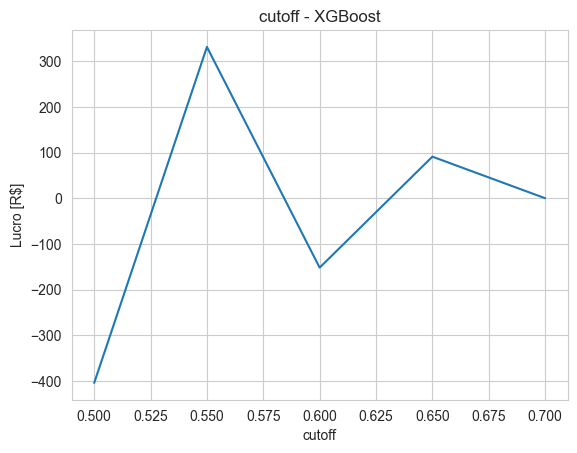

In [66]:
sns.lineplot(df_cutoff_xgboost,x='cutoff',y='lucro')
plt.ylabel('Lucro [R$]')
plt.title('cutoff - XGBoost');

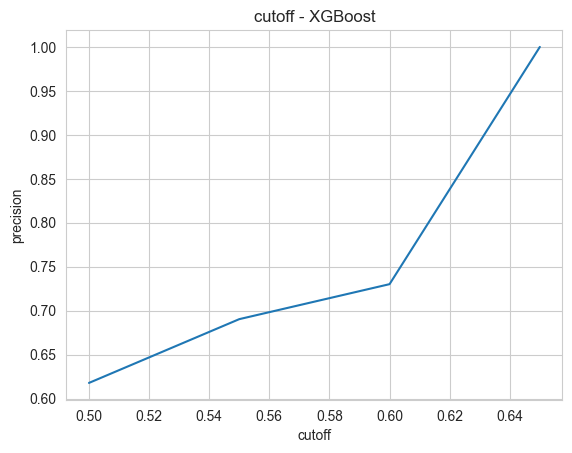

In [67]:
sns.lineplot(df_cutoff,x='cutoff',y='precision')
plt.title('cutoff - XGBoost');

In [68]:
cutoff_007 = df_cutoff[df_cutoff['precision'] >= 0.7]
cutoff_007 = cutoff_007['cutoff'].min()
cutoff_007

np.float64(0.6)

In [69]:
y_pred_val_bin = y_pred_xgboost_grid_search_cv.copy()

for score in range(0,len(y_pred_xgboost_grid_search_cv-1)):
    if y_pred_xgboost_grid_search_cv[score] >= cutoff_007:

        y_pred_val_bin[score] = 1

    else:
        y_pred_val_bin[score] = 0 



matriz_not_null = confusion_matrix(y_test_not_null, y_pred_val_bin)
denominador_not_null = matriz_not_null[0][1] + matriz_not_null[1][1]
numerador_not_null = matriz_not_null[1][1]

precision_not_null = (numerador_not_null/denominador_not_null)
recall_not_null = (numerador_not_null/(numerador_not_null + matriz_not_null[1][0]))
accuracy_not_null = (numerador_not_null + matriz_not_null[0][0])/matriz_not_null.sum()

print(f'Matriz confusão:\n{matriz_not_null}')
print(f'Precision: {precision_not_null:.4f}')
print(f'Recall: {recall_not_null:.4f}')
print(f'Accuracy: {accuracy_not_null:.4f}')


precision_xgboost_home_not_null_grid_search_cv_cutoff = precision_not_null
recall_xgboost_home_not_null_grid_search_cv_cutoff = recall_not_null
accuracy_xgboost_home_not_null_grid_search_cv_cutoff = accuracy_not_null

Matriz confusão:
[[1309   17]
 [1036   46]]
Precision: 0.7302
Recall: 0.0425
Accuracy: 0.5627


#### LightGBM com GridSearchCV - Cutoff

In [70]:
x_test_not_null.shape

(2408, 35)

In [71]:
y_pred_not_null_lightgbm_cutoff = model_lightGBM_grid_search_cv.predict_proba(x_test_not_null)

list_cutoff = [0.5,0.55,0.6,0.65,0.7]
list_precision = []
list_saldo = []

for cutoff in list_cutoff:

    y_pred_val_bin = []
    list_aposta = []

    for score in range(0,len(y_pred_not_null_lightgbm_cutoff-1)):
        if y_pred_not_null_lightgbm_cutoff[score][1] >= cutoff:
            y_pred_val_bin.append(1)
            list_aposta.append(100)
        else:
            y_pred_val_bin.append(0)
            list_aposta.append(0)



    saldo = 1000
    for i in range(len(list_aposta)):

        aposta_pred = y_pred_val_bin[i]
        aposta_real = y_test_not_null['result'].values[i]
        odd = list_odds[i]
        aposta = list_aposta[i]

        if (aposta_pred == 1) and (aposta_real == 1):
            saldo = saldo + (odd - 1)*aposta

        else:
            saldo = saldo - aposta


    list_saldo.append(saldo)


    matriz_cutoff = confusion_matrix(y_test_not_null, y_pred_val_bin)
    denominador_matriz_cutoff = matriz_cutoff[0][1] + matriz_cutoff[1][1]
    numerador_matriz_cutoff = matriz_cutoff[1][1]

    precision_matriz_cutoff = (numerador_matriz_cutoff/denominador_matriz_cutoff)

    list_precision.append(precision_matriz_cutoff)


df_cutoff_ligth_gmb = pd.DataFrame()
df_cutoff_ligth_gmb['cutoff'] = list_cutoff
df_cutoff_ligth_gmb['precision'] = list_precision
df_cutoff_ligth_gmb['saldo'] = list_saldo
df_cutoff_ligth_gmb['lucro'] = df_cutoff_ligth_gmb['saldo'] - 1000

df_cutoff_ligth_gmb

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7


,cutoff,precision,saldo,lucro
0,0.50,0.628968,1969.538462,969.538462
1,0.55,0.686567,1230.333333,230.333333
2,0.60,0.708861,630.000000,-370.000000
3,0.65,0.800000,982.000000,-18.000000
4,0.70,NaN,1000.000000,0.000000


Text(0.5, 1.0, 'cutoff - lightGBM')

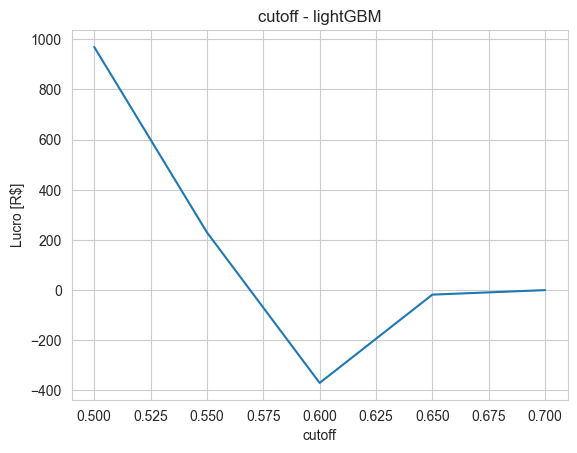

In [73]:
sns.lineplot(df_cutoff_ligth_gmb,x='cutoff',y='lucro')
plt.ylabel('Lucro [R$]')
plt.title('cutoff - lightGBM')

Text(0.5, 1.0, 'cutoff - lightGBM')

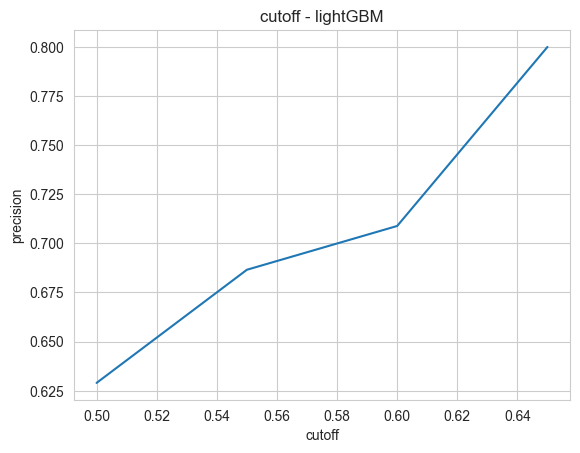

In [74]:
sns.lineplot(df_cutoff_ligth_gmb,x='cutoff',y='precision')
plt.title('cutoff - lightGBM')

Avaliando o acumulado para o lightGBM grid search cv

In [ ]:
y_pred_not_null_lightgbm_cutoff = model_lightGBM_grid_search_cv.predict_proba(x_test_not_null)

list_cutoff = [0.5]
list_precision = []
list_saldo = []
acumulado = []

for cutoff in list_cutoff:

    y_pred_val_bin = []
    list_aposta = []

    for score in range(0,len(y_pred_not_null_lightgbm_cutoff-1)):
        if y_pred_not_null_lightgbm_cutoff[score][1] >= cutoff:
            y_pred_val_bin.append(1)
            list_aposta.append(100)
        else:
            y_pred_val_bin.append(0)
            list_aposta.append(0)



    saldo = 1000
    for i in range(len(list_aposta)):

        aposta_pred = y_pred_val_bin[i]
        aposta_real = y_test_not_null['result'].values[i]
        odd = list_odds[i]
        aposta = list_aposta[i]

        if (aposta_pred == 1) and (aposta_real == 1):
            saldo = saldo + (odd - 1)*aposta

        else:
            saldo = saldo - aposta


        acumulado.append(saldo)


df_cutoff_ligth_gmb_acumulado = pd.DataFrame()
df_cutoff_ligth_gmb_acumulado['result'] = y_test_not_null['result'].values
df_cutoff_ligth_gmb_acumulado['indicacao_aposta'] = y_pred_val_bin
df_cutoff_ligth_gmb_acumulado['saldo_acumulado'] = acumulado



df_cutoff_ligth_gmb_acumulado['status'] = np.where(
    df_cutoff_ligth_gmb_acumulado['indicacao_aposta'] == 1,
    np.where(
        df_cutoff_ligth_gmb_acumulado['result'] == 1,
        'Gain',
        'Loss'
    ),
    ''
)


df_cutoff_ligth_gmb_acumulado

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7


,result,indicacao_aposta,saldo_acumulado,status
0,1,1,1057.000000,Gain
1,0,0,1057.000000,
2,1,0,1057.000000,
3,0,0,1057.000000,
4,1,1,1093.000000,Gain
...,...,...,...,...
2403,1,0,1889.538462,
2404,1,0,1889.538462,
2405,1,1,1969.538462,Gain
2406,1,0,1969.538462,


In [76]:
df_cutoff_ligth_gmb_acumulado.groupby(['status']).size()

status
        1904
Gain     317
Loss     187
dtype: int64

In [78]:
gain = df_cutoff_ligth_gmb_acumulado.groupby(['status']).size()['Gain']
loss = df_cutoff_ligth_gmb_acumulado.groupby(['status']).size()['Loss']

loss_perc = loss / (gain + loss)
loss_perc

np.float64(0.37103174603174605)

In [80]:
df_cutoff_ligth_gmb_acumulado['indicacao_aposta'].sum()

np.int64(504)

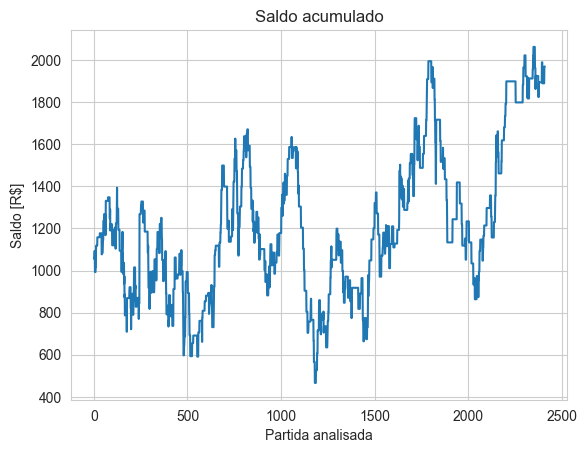

In [87]:
sns.lineplot(df_cutoff_ligth_gmb_acumulado,x=df_cutoff_ligth_gmb_acumulado.index,y='saldo_acumulado')
plt.ylabel('Saldo [R$]')
plt.xlabel('Partida analisada')
plt.title('Saldo acumulado');